In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=0.3 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 34206 
    Total predicted counts          : 34188.74
    Total off counts                : 101269.00

    Total background counts         : 20253.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 1min 5s, sys: 612 ms, total: 1min 6s
Wall time: 1min 19s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 34383 
    Total predicted counts          : 34347.94
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 34005 
    Total predicted counts          : 34232.74
    Total off counts                : 101489.00

    Total background counts         : 20

SpectrumDatasetOnOff

    Name                            : obs_12 

    Total counts                    : 34244 
    Total predicted counts          : 34304.14
    Total off counts                : 101846.00

    Total background counts         : 20369.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_13 

    Total counts                    : 33943 
    Total predicted counts          : 34326.34
    Total off counts                : 101957.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_25 

    Total counts                    : 34197 
    Total predicted counts          : 34213.74
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_26 

    Total counts                    : 34403 
    Total predicted counts          : 34223.54
    Total off counts                : 101443.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_37 

    Total counts                    : 34368 
    Total predicted counts          : 34290.54
    Total off counts                : 101778.00

    Total background counts         : 20355.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_38 

    Total counts                    : 34292 
    Total predicted counts          : 34169.14
    Total off counts                : 101171.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_50 

    Total counts                    : 34402 
    Total predicted counts          : 34312.14
    Total off counts                : 101886.00

    Total background counts         : 20377.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_51 

    Total counts                    : 34123 
    Total predicted counts          : 34273.34
    Total off counts                : 101692.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_62 

    Total counts                    : 34485 
    Total predicted counts          : 34236.74
    Total off counts                : 101509.00

    Total background counts         : 20301.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_63 

    Total counts                    : 34213 
    Total predicted counts          : 34219.34
    Total off counts                : 101422.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_76 

    Total counts                    : 34288 
    Total predicted counts          : 34270.74
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_77 

    Total counts                    : 34097 
    Total predicted counts          : 34236.74
    Total off counts                : 101509.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_90 

    Total counts                    : 34118 
    Total predicted counts          : 34368.54
    Total off counts                : 102168.00

    Total background counts         : 20433.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_91 

    Total counts                    : 34226 
    Total predicted counts          : 34330.74
    Total off counts                : 101979.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_106 

    Total counts                    : 34210 
    Total predicted counts          : 34304.74
    Total off counts                : 101849.00

    Total background counts         : 20369.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_107 

    Total counts                    : 34357 
    Total predicted counts          : 34328.94
    Total off counts                : 101970.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_120 

    Total counts                    : 34273 
    Total predicted counts          : 34261.74
    Total off counts                : 101634.00

    Total background counts         : 20326.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_121 

    Total counts                    : 34528 
    Total predicted counts          : 34296.34
    Total off counts                : 101807.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_133 

    Total counts                    : 33914 
    Total predicted counts          : 34262.74
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_134 

    Total counts                    : 34251 
    Total predicted counts          : 34251.94
    Total off counts                : 101585.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_146 

    Total counts                    : 34387 
    Total predicted counts          : 34296.94
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_147 

    Total counts                    : 34118 
    Total predicted counts          : 34263.14
    Total off counts                : 101641.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_160 

    Total counts                    : 34304 
    Total predicted counts          : 34347.14
    Total off counts                : 102061.00

    Total background counts         : 20412.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_161 

    Total counts                    : 34410 
    Total predicted counts          : 34297.94
    Total off counts                : 101815.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_174 

    Total counts                    : 34172 
    Total predicted counts          : 34084.94
    Total off counts                : 100750.00

    Total background counts         : 20150.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_175 

    Total counts                    : 34576 
    Total predicted counts          : 34255.94
    Total off counts                : 101605.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_188 

    Total counts                    : 33984 
    Total predicted counts          : 34265.34
    Total off counts                : 101652.00

    Total background counts         : 20330.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_189 

    Total counts                    : 34271 
    Total predicted counts          : 34195.54
    Total off counts                : 101303.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_204 

    Total counts                    : 34494 
    Total predicted counts          : 34255.74
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_205 

    Total counts                    : 34437 
    Total predicted counts          : 34243.94
    Total off counts                : 101545.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_219 

    Total counts                    : 34072 
    Total predicted counts          : 34256.34
    Total off counts                : 101607.00

    Total background counts         : 20321.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_220 

    Total counts                    : 34138 
    Total predicted counts          : 34278.34
    Total off counts                : 101717.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_234 

    Total counts                    : 34483 
    Total predicted counts          : 34275.14
    Total off counts                : 101701.00

    Total background counts         : 20340.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_235 

    Total counts                    : 34137 
    Total predicted counts          : 34130.34
    Total off counts                : 100977.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_250 

    Total counts                    : 34112 
    Total predicted counts          : 34268.94
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_251 

    Total counts                    : 34409 
    Total predicted counts          : 34293.94
    Total off counts                : 101795.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_266 

    Total counts                    : 34268 
    Total predicted counts          : 34214.14
    Total off counts                : 101396.00

    Total background counts         : 20279.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_267 

    Total counts                    : 34257 
    Total predicted counts          : 34292.34
    Total off counts                : 101787.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_282 

    Total counts                    : 34114 
    Total predicted counts          : 34253.54
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_283 

    Total counts                    : 34392 
    Total predicted counts          : 34187.94
    Total off counts                : 101265.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_298 

    Total counts                    : 34164 
    Total predicted counts          : 34251.34
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_299 

    Total counts                    : 34294 
    Total predicted counts          : 34168.94
    Total off counts                : 101170.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_314 

    Total counts                    : 34562 
    Total predicted counts          : 34233.34
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_315 

    Total counts                    : 33935 
    Total predicted counts          : 34241.54
    Total off counts                : 101533.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_329 

    Total counts                    : 34010 
    Total predicted counts          : 34204.94
    Total off counts                : 101350.00

    Total background counts         : 20270.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_330 

    Total counts                    : 34110 
    Total predicted counts          : 34305.74
    Total off counts                : 101854.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_343 

    Total counts                    : 34169 
    Total predicted counts          : 34246.14
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_344 

    Total counts                    : 34165 
    Total predicted counts          : 34234.14
    Total off counts                : 101496.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_357 

    Total counts                    : 34381 
    Total predicted counts          : 34251.34
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_358 

    Total counts                    : 34347 
    Total predicted counts          : 34212.34
    Total off counts                : 101387.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_371 

    Total counts                    : 34043 
    Total predicted counts          : 34180.34
    Total off counts                : 101227.00

    Total background counts         : 20245.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_372 

    Total counts                    : 34285 
    Total predicted counts          : 34228.54
    Total off counts                : 101468.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_383 

    Total counts                    : 34195 
    Total predicted counts          : 34339.14
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_384 

    Total counts                    : 34226 
    Total predicted counts          : 34333.74
    Total off counts                : 101994.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_395 

    Total counts                    : 34232 
    Total predicted counts          : 34238.34
    Total off counts                : 101517.00

    Total background counts         : 20303.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_396 

    Total counts                    : 34387 
    Total predicted counts          : 34206.94
    Total off counts                : 101360.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_407 

    Total counts                    : 34198 
    Total predicted counts          : 34323.34
    Total off counts                : 101942.00

    Total background counts         : 20388.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_408 

    Total counts                    : 34430 
    Total predicted counts          : 34248.34
    Total off counts                : 101567.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_420 

    Total counts                    : 34228 
    Total predicted counts          : 34256.34
    Total off counts                : 101607.00

    Total background counts         : 20321.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_421 

    Total counts                    : 34004 
    Total predicted counts          : 34104.14
    Total off counts                : 100846.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_435 

    Total counts                    : 34558 
    Total predicted counts          : 34171.34
    Total off counts                : 101182.00

    Total background counts         : 20236.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_436 

    Total counts                    : 34056 
    Total predicted counts          : 34329.54
    Total off counts                : 101973.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_450 

    Total counts                    : 34359 
    Total predicted counts          : 34301.14
    Total off counts                : 101831.00

    Total background counts         : 20366.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_451 

    Total counts                    : 34169 
    Total predicted counts          : 34248.14
    Total off counts                : 101566.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_464 

    Total counts                    : 34146 
    Total predicted counts          : 34227.94
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_465 

    Total counts                    : 34124 
    Total predicted counts          : 34164.94
    Total off counts                : 101150.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_477 

    Total counts                    : 34408 
    Total predicted counts          : 34239.74
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_478 

    Total counts                    : 34204 
    Total predicted counts          : 34268.74
    Total off counts                : 101669.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_490 

    Total counts                    : 34423 
    Total predicted counts          : 34291.54
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_491 

    Total counts                    : 33982 
    Total predicted counts          : 34330.54
    Total off counts                : 101978.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_504 

    Total counts                    : 34091 
    Total predicted counts          : 34253.94
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_505 

    Total counts                    : 33946 
    Total predicted counts          : 34303.94
    Total off counts                : 101845.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_519 

    Total counts                    : 34298 
    Total predicted counts          : 34237.94
    Total off counts                : 101515.00

    Total background counts         : 20303.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_520 

    Total counts                    : 34066 
    Total predicted counts          : 34246.34
    Total off counts                : 101557.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_534 

    Total counts                    : 34554 
    Total predicted counts          : 34258.34
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_535 

    Total counts                    : 34289 
    Total predicted counts          : 34188.14
    Total off counts                : 101266.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_548 

    Total counts                    : 34163 
    Total predicted counts          : 34276.14
    Total off counts                : 101706.00

    Total background counts         : 20341.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_549 

    Total counts                    : 34395 
    Total predicted counts          : 34280.74
    Total off counts                : 101729.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_562 

    Total counts                    : 33903 
    Total predicted counts          : 34163.34
    Total off counts                : 101142.00

    Total background counts         : 20228.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_563 

    Total counts                    : 34285 
    Total predicted counts          : 34180.14
    Total off counts                : 101226.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_575 

    Total counts                    : 34051 
    Total predicted counts          : 34295.34
    Total off counts                : 101802.00

    Total background counts         : 20360.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_576 

    Total counts                    : 34578 
    Total predicted counts          : 34285.34
    Total off counts                : 101752.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_590 

    Total counts                    : 34346 
    Total predicted counts          : 34225.14
    Total off counts                : 101451.00

    Total background counts         : 20290.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_591 

    Total counts                    : 34264 
    Total predicted counts          : 34372.34
    Total off counts                : 102187.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_603 

    Total counts                    : 33941 
    Total predicted counts          : 34281.74
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_604 

    Total counts                    : 34246 
    Total predicted counts          : 34214.94
    Total off counts                : 101400.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_617 

    Total counts                    : 34217 
    Total predicted counts          : 34213.14
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_618 

    Total counts                    : 34433 
    Total predicted counts          : 34218.14
    Total off counts                : 101416.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_630 

    Total counts                    : 34223 
    Total predicted counts          : 34342.94
    Total off counts                : 102040.00

    Total background counts         : 20408.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_631 

    Total counts                    : 34131 
    Total predicted counts          : 34297.34
    Total off counts                : 101812.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_645 

    Total counts                    : 34484 
    Total predicted counts          : 34274.74
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_646 

    Total counts                    : 34134 
    Total predicted counts          : 34267.54
    Total off counts                : 101663.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_659 

    Total counts                    : 34263 
    Total predicted counts          : 34251.74
    Total off counts                : 101584.00

    Total background counts         : 20316.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_660 

    Total counts                    : 34318 
    Total predicted counts          : 34263.54
    Total off counts                : 101643.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_673 

    Total counts                    : 34080 
    Total predicted counts          : 34248.14
    Total off counts                : 101566.00

    Total background counts         : 20313.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_674 

    Total counts                    : 34209 
    Total predicted counts          : 34251.14
    Total off counts                : 101581.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_687 

    Total counts                    : 34354 
    Total predicted counts          : 34260.14
    Total off counts                : 101626.00

    Total background counts         : 20325.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_688 

    Total counts                    : 34086 
    Total predicted counts          : 34188.54
    Total off counts                : 101268.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_702 

    Total counts                    : 34040 
    Total predicted counts          : 34285.74
    Total off counts                : 101754.00

    Total background counts         : 20350.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_703 

    Total counts                    : 34358 
    Total predicted counts          : 34250.14
    Total off counts                : 101576.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_715 

    Total counts                    : 34225 
    Total predicted counts          : 34283.54
    Total off counts                : 101743.00

    Total background counts         : 20348.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_716 

    Total counts                    : 34281 
    Total predicted counts          : 34105.54
    Total off counts                : 100853.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_727 

    Total counts                    : 34179 
    Total predicted counts          : 34265.14
    Total off counts                : 101651.00

    Total background counts         : 20330.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_728 

    Total counts                    : 34000 
    Total predicted counts          : 34187.74
    Total off counts                : 101264.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_742 

    Total counts                    : 34380 
    Total predicted counts          : 34203.14
    Total off counts                : 101341.00

    Total background counts         : 20268.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_743 

    Total counts                    : 34265 
    Total predicted counts          : 34160.74
    Total off counts                : 101129.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_757 

    Total counts                    : 34416 
    Total predicted counts          : 34227.54
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_758 

    Total counts                    : 34137 
    Total predicted counts          : 34268.14
    Total off counts                : 101666.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_770 

    Total counts                    : 34442 
    Total predicted counts          : 34214.54
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_771 

    Total counts                    : 34459 
    Total predicted counts          : 34279.54
    Total off counts                : 101723.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_783 

    Total counts                    : 34156 
    Total predicted counts          : 34194.74
    Total off counts                : 101299.00

    Total background counts         : 20259.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_784 

    Total counts                    : 34126 
    Total predicted counts          : 34242.54
    Total off counts                : 101538.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_798 

    Total counts                    : 33898 
    Total predicted counts          : 34225.74
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_799 

    Total counts                    : 34763 
    Total predicted counts          : 34178.94
    Total off counts                : 101220.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_812 

    Total counts                    : 34403 
    Total predicted counts          : 34289.94
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_813 

    Total counts                    : 34130 
    Total predicted counts          : 34211.34
    Total off counts                : 101382.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_826 

    Total counts                    : 34524 
    Total predicted counts          : 34300.94
    Total off counts                : 101830.00

    Total background counts         : 20366.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_827 

    Total counts                    : 34107 
    Total predicted counts          : 34269.14
    Total off counts                : 101671.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_841 

    Total counts                    : 34481 
    Total predicted counts          : 34249.74
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_842 

    Total counts                    : 34245 
    Total predicted counts          : 34197.94
    Total off counts                : 101315.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_856 

    Total counts                    : 34541 
    Total predicted counts          : 34242.74
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_857 

    Total counts                    : 34049 
    Total predicted counts          : 34287.14
    Total off counts                : 101761.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_870 

    Total counts                    : 33768 
    Total predicted counts          : 34079.54
    Total off counts                : 100723.00

    Total background counts         : 20144.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_871 

    Total counts                    : 34299 
    Total predicted counts          : 34198.54
    Total off counts                : 101318.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_886 

    Total counts                    : 34275 
    Total predicted counts          : 34254.14
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_887 

    Total counts                    : 34265 
    Total predicted counts          : 34227.14
    Total off counts                : 101461.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_900 

    Total counts                    : 34460 
    Total predicted counts          : 34208.14
    Total off counts                : 101366.00

    Total background counts         : 20273.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_901 

    Total counts                    : 34293 
    Total predicted counts          : 34208.34
    Total off counts                : 101367.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_915 

    Total counts                    : 34187 
    Total predicted counts          : 34286.34
    Total off counts                : 101757.00

    Total background counts         : 20351.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_916 

    Total counts                    : 34745 
    Total predicted counts          : 34295.94
    Total off counts                : 101805.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_931 

    Total counts                    : 34435 
    Total predicted counts          : 34274.74
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_932 

    Total counts                    : 34108 
    Total predicted counts          : 34294.74
    Total off counts                : 101799.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_946 

    Total counts                    : 34235 
    Total predicted counts          : 34253.94
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_947 

    Total counts                    : 34147 
    Total predicted counts          : 34165.54
    Total off counts                : 101153.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_961 

    Total counts                    : 34418 
    Total predicted counts          : 34217.14
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_962 

    Total counts                    : 34109 
    Total predicted counts          : 34197.74
    Total off counts                : 101314.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_975 

    Total counts                    : 34342 
    Total predicted counts          : 34237.54
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_976 

    Total counts                    : 34667 
    Total predicted counts          : 34246.94
    Total off counts                : 101560.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_991 

    Total counts                    : 34840 
    Total predicted counts          : 34233.54
    Total off counts                : 101493.00

    Total background counts         : 20298.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_992 

    Total counts                    : 34319 
    Total predicted counts          : 34152.94
    Total off counts                : 101090.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_1007 

    Total counts                    : 34581 
    Total predicted counts          : 34275.34
    Total off counts                : 101702.00

    Total background counts         : 20340.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1008 

    Total counts                    : 34296 
    Total predicted counts          : 34304.54
    Total off counts                : 101848.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1022 

    Total counts                    : 34142 
    Total predicted counts          : 34263.74
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1023 

    Total counts                    : 34418 
    Total predicted counts          : 34267.74
    Total off counts                : 101664.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1038 

    Total counts                    : 34466 
    Total predicted counts          : 34331.34
    Total off counts                : 101982.00

    Total background counts         : 20396.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1039 

    Total counts                    : 34323 
    Total predicted counts          : 34149.74
    Total off counts                : 101074.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1053 

    Total counts                    : 34474 
    Total predicted counts          : 34352.14
    Total off counts                : 102086.00

    Total background counts         : 20417.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1054 

    Total counts                    : 34754 
    Total predicted counts          : 34219.34
    Total off counts                : 101422.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1067 

    Total counts                    : 33979 
    Total predicted counts          : 34239.34
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1068 

    Total counts                    : 34316 
    Total predicted counts          : 34162.14
    Total off counts                : 101136.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1081 

    Total counts                    : 34468 
    Total predicted counts          : 34245.14
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1082 

    Total counts                    : 34091 
    Total predicted counts          : 34435.34
    Total off counts                : 102502.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1094 

    Total counts                    : 34140 
    Total predicted counts          : 34155.94
    Total off counts                : 101105.00

    Total background counts         : 20221.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1095 

    Total counts                    : 34239 
    Total predicted counts          : 34217.14
    Total off counts                : 101411.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1107 

    Total counts                    : 34395 
    Total predicted counts          : 34242.54
    Total off counts                : 101538.00

    Total background counts         : 20307.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1108 

    Total counts                    : 34337 
    Total predicted counts          : 34315.94
    Total off counts                : 101905.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1120 

    Total counts                    : 34368 
    Total predicted counts          : 34247.14
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1121 

    Total counts                    : 34239 
    Total predicted counts          : 34329.94
    Total off counts                : 101975.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1134 

    Total counts                    : 34046 
    Total predicted counts          : 34214.54
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1135 

    Total counts                    : 34105 
    Total predicted counts          : 34295.54
    Total off counts                : 101803.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1147 

    Total counts                    : 34315 
    Total predicted counts          : 34356.74
    Total off counts                : 102109.00

    Total background counts         : 20421.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1148 

    Total counts                    : 33996 
    Total predicted counts          : 34306.74
    Total off counts                : 101859.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1161 

    Total counts                    : 34281 
    Total predicted counts          : 34270.94
    Total off counts                : 101680.00

    Total background counts         : 20336.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1162 

    Total counts                    : 34288 
    Total predicted counts          : 34338.14
    Total off counts                : 102016.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1175 

    Total counts                    : 34338 
    Total predicted counts          : 34377.34
    Total off counts                : 102212.00

    Total background counts         : 20442.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1176 

    Total counts                    : 34190 
    Total predicted counts          : 34242.34
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1191 

    Total counts                    : 34346 
    Total predicted counts          : 34220.14
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1192 

    Total counts                    : 34226 
    Total predicted counts          : 34325.94
    Total off counts                : 101955.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1206 

    Total counts                    : 34206 
    Total predicted counts          : 34360.54
    Total off counts                : 102128.00

    Total background counts         : 20425.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1207 

    Total counts                    : 34147 
    Total predicted counts          : 34217.14
    Total off counts                : 101411.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1222 

    Total counts                    : 34082 
    Total predicted counts          : 34406.34
    Total off counts                : 102357.00

    Total background counts         : 20471.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1223 

    Total counts                    : 34289 
    Total predicted counts          : 34339.74
    Total off counts                : 102024.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1238 

    Total counts                    : 34372 
    Total predicted counts          : 34155.54
    Total off counts                : 101103.00

    Total background counts         : 20220.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1239 

    Total counts                    : 34154 
    Total predicted counts          : 34318.54
    Total off counts                : 101918.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1255 

    Total counts                    : 34083 
    Total predicted counts          : 34271.14
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1256 

    Total counts                    : 34155 
    Total predicted counts          : 34347.74
    Total off counts                : 102064.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1271 

    Total counts                    : 34076 
    Total predicted counts          : 34330.74
    Total off counts                : 101979.00

    Total background counts         : 20395.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1272 

    Total counts                    : 34066 
    Total predicted counts          : 34253.14
    Total off counts                : 101591.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1288 

    Total counts                    : 34263 
    Total predicted counts          : 34316.94
    Total off counts                : 101910.00

    Total background counts         : 20382.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1289 

    Total counts                    : 34432 
    Total predicted counts          : 34165.74
    Total off counts                : 101154.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1305 

    Total counts                    : 34253 
    Total predicted counts          : 34235.94
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1306 

    Total counts                    : 34232 
    Total predicted counts          : 34164.74
    Total off counts                : 101149.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1319 

    Total counts                    : 34454 
    Total predicted counts          : 34274.74
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1320 

    Total counts                    : 34359 
    Total predicted counts          : 34218.74
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1333 

    Total counts                    : 34446 
    Total predicted counts          : 34083.94
    Total off counts                : 100745.00

    Total background counts         : 20149.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1334 

    Total counts                    : 34141 
    Total predicted counts          : 34193.74
    Total off counts                : 101294.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1348 

    Total counts                    : 34282 
    Total predicted counts          : 34202.94
    Total off counts                : 101340.00

    Total background counts         : 20268.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1349 

    Total counts                    : 34150 
    Total predicted counts          : 34245.54
    Total off counts                : 101553.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1360 

    Total counts                    : 33921 
    Total predicted counts          : 34226.54
    Total off counts                : 101458.00

    Total background counts         : 20291.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1361 

    Total counts                    : 34391 
    Total predicted counts          : 34189.74
    Total off counts                : 101274.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1373 

    Total counts                    : 34495 
    Total predicted counts          : 34264.74
    Total off counts                : 101649.00

    Total background counts         : 20329.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1374 

    Total counts                    : 34024 
    Total predicted counts          : 34165.94
    Total off counts                : 101155.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1387 

    Total counts                    : 34162 
    Total predicted counts          : 34271.94
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1388 

    Total counts                    : 34391 
    Total predicted counts          : 34274.94
    Total off counts                : 101700.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1401 

    Total counts                    : 34305 
    Total predicted counts          : 34124.14
    Total off counts                : 100946.00

    Total background counts         : 20189.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1402 

    Total counts                    : 34217 
    Total predicted counts          : 34314.74
    Total off counts                : 101899.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1417 

    Total counts                    : 34280 
    Total predicted counts          : 34239.14
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1418 

    Total counts                    : 34258 
    Total predicted counts          : 34247.34
    Total off counts                : 101562.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1433 

    Total counts                    : 34378 
    Total predicted counts          : 34166.74
    Total off counts                : 101159.00

    Total background counts         : 20231.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1434 

    Total counts                    : 34136 
    Total predicted counts          : 34230.34
    Total off counts                : 101477.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1450 

    Total counts                    : 34329 
    Total predicted counts          : 34205.34
    Total off counts                : 101352.00

    Total background counts         : 20270.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1451 

    Total counts                    : 34190 
    Total predicted counts          : 34162.54
    Total off counts                : 101138.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1465 

    Total counts                    : 34270 
    Total predicted counts          : 34268.54
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1466 

    Total counts                    : 34433 
    Total predicted counts          : 34257.74
    Total off counts                : 101614.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1481 

    Total counts                    : 34492 
    Total predicted counts          : 34283.34
    Total off counts                : 101742.00

    Total background counts         : 20348.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1482 

    Total counts                    : 34113 
    Total predicted counts          : 34159.74
    Total off counts                : 101124.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1496 

    Total counts                    : 34275 
    Total predicted counts          : 34212.14
    Total off counts                : 101386.00

    Total background counts         : 20277.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1497 

    Total counts                    : 34288 
    Total predicted counts          : 34145.54
    Total off counts                : 101053.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1511 

    Total counts                    : 34348 
    Total predicted counts          : 34147.54
    Total off counts                : 101063.00

    Total background counts         : 20212.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1512 

    Total counts                    : 34320 
    Total predicted counts          : 34168.14
    Total off counts                : 101166.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1526 

    Total counts                    : 34597 
    Total predicted counts          : 34236.94
    Total off counts                : 101510.00

    Total background counts         : 20302.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1527 

    Total counts                    : 34026 
    Total predicted counts          : 34348.74
    Total off counts                : 102069.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1542 

    Total counts                    : 34061 
    Total predicted counts          : 34249.74
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1543 

    Total counts                    : 34408 
    Total predicted counts          : 34285.34
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1558 

    Total counts                    : 34152 
    Total predicted counts          : 34192.54
    Total off counts                : 101288.00

    Total background counts         : 20257.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1559 

    Total counts                    : 34179 
    Total predicted counts          : 34250.94
    Total off counts                : 101580.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1573 

    Total counts                    : 34136 
    Total predicted counts          : 34280.54
    Total off counts                : 101728.00

    Total background counts         : 20345.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1574 

    Total counts                    : 34318 
    Total predicted counts          : 34227.94
    Total off counts                : 101465.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1584 

    Total counts                    : 34002 
    Total predicted counts          : 34243.14
    Total off counts                : 101541.00

    Total background counts         : 20308.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1585 

    Total counts                    : 34264 
    Total predicted counts          : 34186.14
    Total off counts                : 101256.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1599 

    Total counts                    : 34252 
    Total predicted counts          : 34274.34
    Total off counts                : 101697.00

    Total background counts         : 20339.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1600 

    Total counts                    : 34361 
    Total predicted counts          : 34224.94
    Total off counts                : 101450.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1616 

    Total counts                    : 34178 
    Total predicted counts          : 34184.34
    Total off counts                : 101247.00

    Total background counts         : 20249.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1617 

    Total counts                    : 34361 
    Total predicted counts          : 34348.94
    Total off counts                : 102070.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1630 

    Total counts                    : 34285 
    Total predicted counts          : 34292.34
    Total off counts                : 101787.00

    Total background counts         : 20357.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1631 

    Total counts                    : 34096 
    Total predicted counts          : 34256.54
    Total off counts                : 101608.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1643 

    Total counts                    : 34511 
    Total predicted counts          : 34322.34
    Total off counts                : 101937.00

    Total background counts         : 20387.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1644 

    Total counts                    : 34142 
    Total predicted counts          : 34262.74
    Total off counts                : 101639.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1659 

    Total counts                    : 34096 
    Total predicted counts          : 34246.74
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1660 

    Total counts                    : 34271 
    Total predicted counts          : 34106.14
    Total off counts                : 100856.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1674 

    Total counts                    : 34163 
    Total predicted counts          : 34304.74
    Total off counts                : 101849.00

    Total background counts         : 20369.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1675 

    Total counts                    : 34162 
    Total predicted counts          : 34176.94
    Total off counts                : 101210.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1688 

    Total counts                    : 34139 
    Total predicted counts          : 34250.74
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1689 

    Total counts                    : 34229 
    Total predicted counts          : 34175.94
    Total off counts                : 101205.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1703 

    Total counts                    : 34033 
    Total predicted counts          : 34351.54
    Total off counts                : 102083.00

    Total background counts         : 20416.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1704 

    Total counts                    : 34013 
    Total predicted counts          : 34218.74
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1717 

    Total counts                    : 33915 
    Total predicted counts          : 34301.54
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1718 

    Total counts                    : 34044 
    Total predicted counts          : 34232.34
    Total off counts                : 101487.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1732 

    Total counts                    : 34230 
    Total predicted counts          : 34284.54
    Total off counts                : 101748.00

    Total background counts         : 20349.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1733 

    Total counts                    : 34052 
    Total predicted counts          : 34286.34
    Total off counts                : 101757.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1747 

    Total counts                    : 34168 
    Total predicted counts          : 34271.54
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1748 

    Total counts                    : 34140 
    Total predicted counts          : 34148.14
    Total off counts                : 101066.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1762 

    Total counts                    : 34218 
    Total predicted counts          : 34293.54
    Total off counts                : 101793.00

    Total background counts         : 20358.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1763 

    Total counts                    : 34147 
    Total predicted counts          : 34148.34
    Total off counts                : 101067.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1777 

    Total counts                    : 34079 
    Total predicted counts          : 34262.34
    Total off counts                : 101637.00

    Total background counts         : 20327.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1778 

    Total counts                    : 34009 
    Total predicted counts          : 34256.14
    Total off counts                : 101606.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1790 

    Total counts                    : 34176 
    Total predicted counts          : 34287.74
    Total off counts                : 101764.00

    Total background counts         : 20352.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1791 

    Total counts                    : 34308 
    Total predicted counts          : 34250.54
    Total off counts                : 101578.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1806 

    Total counts                    : 34378 
    Total predicted counts          : 34227.34
    Total off counts                : 101462.00

    Total background counts         : 20292.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1807 

    Total counts                    : 34155 
    Total predicted counts          : 34313.14
    Total off counts                : 101891.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1818 

    Total counts                    : 34141 
    Total predicted counts          : 34258.54
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1819 

    Total counts                    : 34321 
    Total predicted counts          : 34267.34
    Total off counts                : 101662.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1833 

    Total counts                    : 34317 
    Total predicted counts          : 34193.94
    Total off counts                : 101295.00

    Total background counts         : 20259.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1834 

    Total counts                    : 34164 
    Total predicted counts          : 34298.14
    Total off counts                : 101816.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1847 

    Total counts                    : 34379 
    Total predicted counts          : 34250.74
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1848 

    Total counts                    : 34270 
    Total predicted counts          : 34119.94
    Total off counts                : 100925.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1865 

    Total counts                    : 33853 
    Total predicted counts          : 34293.14
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1866 

    Total counts                    : 33906 
    Total predicted counts          : 34266.54
    Total off counts                : 101658.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1880 

    Total counts                    : 34246 
    Total predicted counts          : 34201.14
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1881 

    Total counts                    : 34249 
    Total predicted counts          : 34234.34
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1895 

    Total counts                    : 34050 
    Total predicted counts          : 34203.54
    Total off counts                : 101343.00

    Total background counts         : 20268.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1896 

    Total counts                    : 34179 
    Total predicted counts          : 34249.34
    Total off counts                : 101572.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1911 

    Total counts                    : 34378 
    Total predicted counts          : 34181.74
    Total off counts                : 101234.00

    Total background counts         : 20246.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1912 

    Total counts                    : 34303 
    Total predicted counts          : 34253.34
    Total off counts                : 101592.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1926 

    Total counts                    : 34199 
    Total predicted counts          : 34253.14
    Total off counts                : 101591.00

    Total background counts         : 20318.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1927 

    Total counts                    : 34027 
    Total predicted counts          : 34303.74
    Total off counts                : 101844.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1941 

    Total counts                    : 34210 
    Total predicted counts          : 34155.94
    Total off counts                : 101105.00

    Total background counts         : 20221.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1942 

    Total counts                    : 34441 
    Total predicted counts          : 34233.54
    Total off counts                : 101493.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1956 

    Total counts                    : 34365 
    Total predicted counts          : 34260.74
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1957 

    Total counts                    : 33991 
    Total predicted counts          : 34217.54
    Total off counts                : 101413.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1973 

    Total counts                    : 34182 
    Total predicted counts          : 34230.94
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1974 

    Total counts                    : 34587 
    Total predicted counts          : 34271.74
    Total off counts                : 101684.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1989 

    Total counts                    : 34323 
    Total predicted counts          : 34337.34
    Total off counts                : 102012.00

    Total background counts         : 20402.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1990 

    Total counts                    : 34406 
    Total predicted counts          : 34229.74
    Total off counts                : 101474.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2005 

    Total counts                    : 34181 
    Total predicted counts          : 34240.54
    Total off counts                : 101528.00

    Total background counts         : 20305.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2006 

    Total counts                    : 34479 
    Total predicted counts          : 34112.94
    Total off counts                : 100890.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2019 

    Total counts                    : 34424 
    Total predicted counts          : 34215.34
    Total off counts                : 101402.00

    Total background counts         : 20280.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2020 

    Total counts                    : 34205 
    Total predicted counts          : 34283.94
    Total off counts                : 101745.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2035 

    Total counts                    : 34041 
    Total predicted counts          : 34201.14
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2036 

    Total counts                    : 34223 
    Total predicted counts          : 34147.14
    Total off counts                : 101061.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2049 

    Total counts                    : 34119 
    Total predicted counts          : 34148.54
    Total off counts                : 101068.00

    Total background counts         : 20213.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2050 

    Total counts                    : 34223 
    Total predicted counts          : 34350.14
    Total off counts                : 102076.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2063 

    Total counts                    : 33974 
    Total predicted counts          : 34240.14
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2064 

    Total counts                    : 34296 
    Total predicted counts          : 34200.34
    Total off counts                : 101327.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2077 

    Total counts                    : 34182 
    Total predicted counts          : 34289.94
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2078 

    Total counts                    : 34033 
    Total predicted counts          : 34199.74
    Total off counts                : 101324.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2092 

    Total counts                    : 33980 
    Total predicted counts          : 34364.74
    Total off counts                : 102149.00

    Total background counts         : 20429.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2093 

    Total counts                    : 34286 
    Total predicted counts          : 34173.74
    Total off counts                : 101194.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2107 

    Total counts                    : 34030 
    Total predicted counts          : 34136.34
    Total off counts                : 101007.00

    Total background counts         : 20201.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2108 

    Total counts                    : 34421 
    Total predicted counts          : 34195.14
    Total off counts                : 101301.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2120 

    Total counts                    : 34212 
    Total predicted counts          : 34260.54
    Total off counts                : 101628.00

    Total background counts         : 20325.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2121 

    Total counts                    : 34168 
    Total predicted counts          : 34129.34
    Total off counts                : 100972.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2135 

    Total counts                    : 34234 
    Total predicted counts          : 34216.74
    Total off counts                : 101409.00

    Total background counts         : 20281.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2136 

    Total counts                    : 34203 
    Total predicted counts          : 34245.54
    Total off counts                : 101553.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2151 

    Total counts                    : 34429 
    Total predicted counts          : 34292.74
    Total off counts                : 101789.00

    Total background counts         : 20357.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2152 

    Total counts                    : 34440 
    Total predicted counts          : 34273.34
    Total off counts                : 101692.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2169 

    Total counts                    : 33953 
    Total predicted counts          : 34146.54
    Total off counts                : 101058.00

    Total background counts         : 20211.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2170 

    Total counts                    : 34765 
    Total predicted counts          : 34172.54
    Total off counts                : 101188.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2186 

    Total counts                    : 34153 
    Total predicted counts          : 34333.94
    Total off counts                : 101995.00

    Total background counts         : 20399.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2187 

    Total counts                    : 34288 
    Total predicted counts          : 34202.54
    Total off counts                : 101338.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2201 

    Total counts                    : 34265 
    Total predicted counts          : 34239.54
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2202 

    Total counts                    : 34301 
    Total predicted counts          : 34168.94
    Total off counts                : 101170.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2217 

    Total counts                    : 34240 
    Total predicted counts          : 34159.74
    Total off counts                : 101124.00

    Total background counts         : 20224.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2218 

    Total counts                    : 34108 
    Total predicted counts          : 34214.74
    Total off counts                : 101399.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2232 

    Total counts                    : 34295 
    Total predicted counts          : 34154.34
    Total off counts                : 101097.00

    Total background counts         : 20219.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2233 

    Total counts                    : 34287 
    Total predicted counts          : 34319.94
    Total off counts                : 101925.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2247 

    Total counts                    : 34362 
    Total predicted counts          : 34247.74
    Total off counts                : 101564.00

    Total background counts         : 20312.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2248 

    Total counts                    : 34215 
    Total predicted counts          : 34209.54
    Total off counts                : 101373.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2263 

    Total counts                    : 34238 
    Total predicted counts          : 34106.54
    Total off counts                : 100858.00

    Total background counts         : 20171.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2264 

    Total counts                    : 33850 
    Total predicted counts          : 34243.34
    Total off counts                : 101542.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2280 

    Total counts                    : 34294 
    Total predicted counts          : 34214.94
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2281 

    Total counts                    : 34179 
    Total predicted counts          : 34240.74
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2297 

    Total counts                    : 34659 
    Total predicted counts          : 34312.14
    Total off counts                : 101886.00

    Total background counts         : 20377.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2298 

    Total counts                    : 34211 
    Total predicted counts          : 34169.74
    Total off counts                : 101174.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2314 

    Total counts                    : 34058 
    Total predicted counts          : 34350.34
    Total off counts                : 102077.00

    Total background counts         : 20415.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2315 

    Total counts                    : 34089 
    Total predicted counts          : 34289.54
    Total off counts                : 101773.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2330 

    Total counts                    : 34380 
    Total predicted counts          : 34342.14
    Total off counts                : 102036.00

    Total background counts         : 20407.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2331 

    Total counts                    : 33937 
    Total predicted counts          : 34171.34
    Total off counts                : 101182.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2347 

    Total counts                    : 34157 
    Total predicted counts          : 34198.14
    Total off counts                : 101316.00

    Total background counts         : 20263.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2348 

    Total counts                    : 33978 
    Total predicted counts          : 34160.34
    Total off counts                : 101127.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2364 

    Total counts                    : 34262 
    Total predicted counts          : 34191.34
    Total off counts                : 101282.00

    Total background counts         : 20256.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2365 

    Total counts                    : 34090 
    Total predicted counts          : 34241.74
    Total off counts                : 101534.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2380 

    Total counts                    : 34432 
    Total predicted counts          : 34205.94
    Total off counts                : 101355.00

    Total background counts         : 20271.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2381 

    Total counts                    : 34547 
    Total predicted counts          : 34263.54
    Total off counts                : 101643.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2398 

    Total counts                    : 34511 
    Total predicted counts          : 34199.54
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2399 

    Total counts                    : 34334 
    Total predicted counts          : 34210.74
    Total off counts                : 101379.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2417 

    Total counts                    : 34060 
    Total predicted counts          : 34252.14
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2418 

    Total counts                    : 34202 
    Total predicted counts          : 34147.34
    Total off counts                : 101062.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2433 

    Total counts                    : 34323 
    Total predicted counts          : 34219.54
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2434 

    Total counts                    : 34151 
    Total predicted counts          : 34181.34
    Total off counts                : 101232.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2448 

    Total counts                    : 33884 
    Total predicted counts          : 34251.14
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2449 

    Total counts                    : 34305 
    Total predicted counts          : 34367.14
    Total off counts                : 102161.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2462 

    Total counts                    : 34322 
    Total predicted counts          : 34267.34
    Total off counts                : 101662.00

    Total background counts         : 20332.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2463 

    Total counts                    : 34001 
    Total predicted counts          : 34120.94
    Total off counts                : 100930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2478 

    Total counts                    : 34367 
    Total predicted counts          : 34214.94
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2479 

    Total counts                    : 34307 
    Total predicted counts          : 34224.14
    Total off counts                : 101446.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2494 

    Total counts                    : 34476 
    Total predicted counts          : 34306.74
    Total off counts                : 101859.00

    Total background counts         : 20371.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2495 

    Total counts                    : 34302 
    Total predicted counts          : 34289.74
    Total off counts                : 101774.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2511 

    Total counts                    : 34497 
    Total predicted counts          : 34210.34
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2512 

    Total counts                    : 34208 
    Total predicted counts          : 34167.74
    Total off counts                : 101164.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2528 

    Total counts                    : 34572 
    Total predicted counts          : 34364.54
    Total off counts                : 102148.00

    Total background counts         : 20429.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2529 

    Total counts                    : 34381 
    Total predicted counts          : 34251.54
    Total off counts                : 101583.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2545 

    Total counts                    : 34417 
    Total predicted counts          : 34186.14
    Total off counts                : 101256.00

    Total background counts         : 20251.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2546 

    Total counts                    : 34064 
    Total predicted counts          : 34331.34
    Total off counts                : 101982.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2561 

    Total counts                    : 34303 
    Total predicted counts          : 34196.14
    Total off counts                : 101306.00

    Total background counts         : 20261.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2562 

    Total counts                    : 34239 
    Total predicted counts          : 34136.54
    Total off counts                : 101008.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2578 

    Total counts                    : 34497 
    Total predicted counts          : 34272.34
    Total off counts                : 101687.00

    Total background counts         : 20337.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2579 

    Total counts                    : 34074 
    Total predicted counts          : 34245.94
    Total off counts                : 101555.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2595 

    Total counts                    : 34207 
    Total predicted counts          : 34249.54
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2596 

    Total counts                    : 34010 
    Total predicted counts          : 34220.74
    Total off counts                : 101429.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2612 

    Total counts                    : 34272 
    Total predicted counts          : 34184.34
    Total off counts                : 101247.00

    Total background counts         : 20249.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2613 

    Total counts                    : 34131 
    Total predicted counts          : 34259.54
    Total off counts                : 101623.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2629 

    Total counts                    : 34462 
    Total predicted counts          : 34234.74
    Total off counts                : 101499.00

    Total background counts         : 20299.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2630 

    Total counts                    : 34339 
    Total predicted counts          : 34214.54
    Total off counts                : 101398.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2646 

    Total counts                    : 34452 
    Total predicted counts          : 34119.94
    Total off counts                : 100925.00

    Total background counts         : 20185.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2647 

    Total counts                    : 34410 
    Total predicted counts          : 34250.74
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2663 

    Total counts                    : 34079 
    Total predicted counts          : 34268.14
    Total off counts                : 101666.00

    Total background counts         : 20333.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2664 

    Total counts                    : 34288 
    Total predicted counts          : 34279.14
    Total off counts                : 101721.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2681 

    Total counts                    : 34395 
    Total predicted counts          : 34216.94
    Total off counts                : 101410.00

    Total background counts         : 20282.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2682 

    Total counts                    : 34171 
    Total predicted counts          : 34179.94
    Total off counts                : 101225.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2702 

    Total counts                    : 34172 
    Total predicted counts          : 34244.54
    Total off counts                : 101548.00

    Total background counts         : 20309.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2703 

    Total counts                    : 34079 
    Total predicted counts          : 34274.14
    Total off counts                : 101696.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2719 

    Total counts                    : 34015 
    Total predicted counts          : 34246.94
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2720 

    Total counts                    : 34375 
    Total predicted counts          : 34215.14
    Total off counts                : 101401.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2735 

    Total counts                    : 34431 
    Total predicted counts          : 34232.54
    Total off counts                : 101488.00

    Total background counts         : 20297.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2736 

    Total counts                    : 34556 
    Total predicted counts          : 34214.74
    Total off counts                : 101399.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2751 

    Total counts                    : 34453 
    Total predicted counts          : 34185.14
    Total off counts                : 101251.00

    Total background counts         : 20250.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2752 

    Total counts                    : 34342 
    Total predicted counts          : 34312.34
    Total off counts                : 101887.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2765 

    Total counts                    : 34193 
    Total predicted counts          : 34288.74
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2766 

    Total counts                    : 34406 
    Total predicted counts          : 34151.14
    Total off counts                : 101081.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2779 

    Total counts                    : 33865 
    Total predicted counts          : 34323.34
    Total off counts                : 101942.00

    Total background counts         : 20388.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2780 

    Total counts                    : 34156 
    Total predicted counts          : 34299.34
    Total off counts                : 101822.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2794 

    Total counts                    : 34027 
    Total predicted counts          : 34208.54
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2795 

    Total counts                    : 34079 
    Total predicted counts          : 34226.54
    Total off counts                : 101458.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2811 

    Total counts                    : 34151 
    Total predicted counts          : 34269.94
    Total off counts                : 101675.00

    Total background counts         : 20335.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2812 

    Total counts                    : 34344 
    Total predicted counts          : 34209.34
    Total off counts                : 101372.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2828 

    Total counts                    : 34402 
    Total predicted counts          : 34200.54
    Total off counts                : 101328.00

    Total background counts         : 20265.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2829 

    Total counts                    : 34542 
    Total predicted counts          : 34260.34
    Total off counts                : 101627.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_2842 

    Total counts                    : 34233 
    Total predicted counts          : 34324.74
    Total off counts                : 101949.00

    Total background counts         : 20389.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2843 

    Total counts                    : 34253 
    Total predicted counts          : 34235.14
    Total off counts                : 101501.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2858 

    Total counts                    : 34132 
    Total predicted counts          : 34171.94
    Total off counts                : 101185.00

    Total background counts         : 20237.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2859 

    Total counts                    : 34207 
    Total predicted counts          : 34206.54
    Total off counts                : 101358.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2874 

    Total counts                    : 34338 
    Total predicted counts          : 34208.74
    Total off counts                : 101369.00

    Total background counts         : 20273.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2875 

    Total counts                    : 34147 
    Total predicted counts          : 34233.54
    Total off counts                : 101493.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2891 

    Total counts                    : 34398 
    Total predicted counts          : 34156.14
    Total off counts                : 101106.00

    Total background counts         : 20221.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2892 

    Total counts                    : 34175 
    Total predicted counts          : 34157.54
    Total off counts                : 101113.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2908 

    Total counts                    : 34218 
    Total predicted counts          : 34214.14
    Total off counts                : 101396.00

    Total background counts         : 20279.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2909 

    Total counts                    : 34340 
    Total predicted counts          : 34135.14
    Total off counts                : 101001.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2925 

    Total counts                    : 34130 
    Total predicted counts          : 34161.74
    Total off counts                : 101134.00

    Total background counts         : 20226.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2926 

    Total counts                    : 34253 
    Total predicted counts          : 34246.94
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2942 

    Total counts                    : 34143 
    Total predicted counts          : 34354.14
    Total off counts                : 102096.00

    Total background counts         : 20419.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2943 

    Total counts                    : 34499 
    Total predicted counts          : 34249.14
    Total off counts                : 101571.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2960 

    Total counts                    : 34561 
    Total predicted counts          : 34221.74
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2961 

    Total counts                    : 34362 
    Total predicted counts          : 34258.74
    Total off counts                : 101619.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2976 

    Total counts                    : 34276 
    Total predicted counts          : 34189.54
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2977 

    Total counts                    : 34276 
    Total predicted counts          : 34144.34
    Total off counts                : 101047.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2988 

    Total counts                    : 34171 
    Total predicted counts          : 34237.34
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2989 

    Total counts                    : 34329 
    Total predicted counts          : 34176.54
    Total off counts                : 101208.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3003 

    Total counts                    : 34004 
    Total predicted counts          : 34165.94
    Total off counts                : 101155.00

    Total background counts         : 20231.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3004 

    Total counts                    : 34087 
    Total predicted counts          : 34263.74
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3020 

    Total counts                    : 34156 
    Total predicted counts          : 34222.94
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3021 

    Total counts                    : 34083 
    Total predicted counts          : 34191.14
    Total off counts                : 101281.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3036 

    Total counts                    : 34304 
    Total predicted counts          : 34322.34
    Total off counts                : 101937.00

    Total background counts         : 20387.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3037 

    Total counts                    : 34183 
    Total predicted counts          : 34193.14
    Total off counts                : 101291.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3052 

    Total counts                    : 34110 
    Total predicted counts          : 34435.74
    Total off counts                : 102504.00

    Total background counts         : 20500.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3053 

    Total counts                    : 34648 
    Total predicted counts          : 34302.54
    Total off counts                : 101838.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3069 

    Total counts                    : 34223 
    Total predicted counts          : 34252.54
    Total off counts                : 101588.00

    Total background counts         : 20317.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3070 

    Total counts                    : 34293 
    Total predicted counts          : 34303.14
    Total off counts                : 101841.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3086 

    Total counts                    : 34334 
    Total predicted counts          : 34336.54
    Total off counts                : 102008.00

    Total background counts         : 20401.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3087 

    Total counts                    : 34199 
    Total predicted counts          : 34317.54
    Total off counts                : 101913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3102 

    Total counts                    : 34442 
    Total predicted counts          : 34156.14
    Total off counts                : 101106.00

    Total background counts         : 20221.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3103 

    Total counts                    : 34179 
    Total predicted counts          : 34182.74
    Total off counts                : 101239.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3118 

    Total counts                    : 33845 
    Total predicted counts          : 34285.34
    Total off counts                : 101752.00

    Total background counts         : 20350.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3119 

    Total counts                    : 34270 
    Total predicted counts          : 34187.34
    Total off counts                : 101262.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3135 

    Total counts                    : 34547 
    Total predicted counts          : 34138.94
    Total off counts                : 101020.00

    Total background counts         : 20204.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3136 

    Total counts                    : 34182 
    Total predicted counts          : 34332.94
    Total off counts                : 101990.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3152 

    Total counts                    : 34216 
    Total predicted counts          : 34254.14
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3153 

    Total counts                    : 34214 
    Total predicted counts          : 34209.74
    Total off counts                : 101374.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3170 

    Total counts                    : 34193 
    Total predicted counts          : 34344.54
    Total off counts                : 102048.00

    Total background counts         : 20409.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3171 

    Total counts                    : 34400 
    Total predicted counts          : 34260.74
    Total off counts                : 101629.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3186 

    Total counts                    : 34284 
    Total predicted counts          : 34128.54
    Total off counts                : 100968.00

    Total background counts         : 20193.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3187 

    Total counts                    : 34502 
    Total predicted counts          : 34289.94
    Total off counts                : 101775.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3200 

    Total counts                    : 34191 
    Total predicted counts          : 34288.74
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3201 

    Total counts                    : 34035 
    Total predicted counts          : 34212.54
    Total off counts                : 101388.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3215 

    Total counts                    : 34290 
    Total predicted counts          : 34241.74
    Total off counts                : 101534.00

    Total background counts         : 20306.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3216 

    Total counts                    : 34547 
    Total predicted counts          : 34196.94
    Total off counts                : 101310.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3229 

    Total counts                    : 34375 
    Total predicted counts          : 34327.34
    Total off counts                : 101962.00

    Total background counts         : 20392.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3230 

    Total counts                    : 34478 
    Total predicted counts          : 34275.74
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3244 

    Total counts                    : 34295 
    Total predicted counts          : 34204.94
    Total off counts                : 101350.00

    Total background counts         : 20270.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3245 

    Total counts                    : 33942 
    Total predicted counts          : 34321.14
    Total off counts                : 101931.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3260 

    Total counts                    : 34288 
    Total predicted counts          : 34165.74
    Total off counts                : 101154.00

    Total background counts         : 20230.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3261 

    Total counts                    : 34527 
    Total predicted counts          : 34243.74
    Total off counts                : 101544.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3275 

    Total counts                    : 34369 
    Total predicted counts          : 34157.14
    Total off counts                : 101111.00

    Total background counts         : 20222.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3276 

    Total counts                    : 34128 
    Total predicted counts          : 34173.94
    Total off counts                : 101195.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3292 

    Total counts                    : 34413 
    Total predicted counts          : 34211.34
    Total off counts                : 101382.00

    Total background counts         : 20276.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3293 

    Total counts                    : 33794 
    Total predicted counts          : 34341.94
    Total off counts                : 102035.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3309 

    Total counts                    : 34304 
    Total predicted counts          : 34234.94
    Total off counts                : 101500.00

    Total background counts         : 20300.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3310 

    Total counts                    : 34385 
    Total predicted counts          : 34264.54
    Total off counts                : 101648.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3326 

    Total counts                    : 34290 
    Total predicted counts          : 34249.14
    Total off counts                : 101571.00

    Total background counts         : 20314.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3327 

    Total counts                    : 34197 
    Total predicted counts          : 34283.14
    Total off counts                : 101741.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3343 

    Total counts                    : 34297 
    Total predicted counts          : 34373.14
    Total off counts                : 102191.00

    Total background counts         : 20438.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3344 

    Total counts                    : 34072 
    Total predicted counts          : 34117.94
    Total off counts                : 100915.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3358 

    Total counts                    : 34166 
    Total predicted counts          : 34178.74
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3359 

    Total counts                    : 34077 
    Total predicted counts          : 34287.74
    Total off counts                : 101764.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3375 

    Total counts                    : 34343 
    Total predicted counts          : 34375.54
    Total off counts                : 102203.00

    Total background counts         : 20440.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3376 

    Total counts                    : 34429 
    Total predicted counts          : 34225.94
    Total off counts                : 101455.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3393 

    Total counts                    : 34178 
    Total predicted counts          : 34302.14
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3394 

    Total counts                    : 34338 
    Total predicted counts          : 34148.94
    Total off counts                : 101070.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3409 

    Total counts                    : 34459 
    Total predicted counts          : 34276.54
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3410 

    Total counts                    : 34598 
    Total predicted counts          : 34307.14
    Total off counts                : 101861.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3425 

    Total counts                    : 34538 
    Total predicted counts          : 34390.54
    Total off counts                : 102278.00

    Total background counts         : 20455.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3426 

    Total counts                    : 34190 
    Total predicted counts          : 34235.34
    Total off counts                : 101502.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3440 

    Total counts                    : 34248 
    Total predicted counts          : 34260.74
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3441 

    Total counts                    : 34164 
    Total predicted counts          : 34151.74
    Total off counts                : 101084.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3456 

    Total counts                    : 33961 
    Total predicted counts          : 34369.34
    Total off counts                : 102172.00

    Total background counts         : 20434.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3457 

    Total counts                    : 34179 
    Total predicted counts          : 34176.54
    Total off counts                : 101208.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3471 

    Total counts                    : 34440 
    Total predicted counts          : 34400.94
    Total off counts                : 102330.00

    Total background counts         : 20466.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3472 

    Total counts                    : 34214 
    Total predicted counts          : 34198.14
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3487 

    Total counts                    : 34237 
    Total predicted counts          : 34273.14
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3488 

    Total counts                    : 34187 
    Total predicted counts          : 34122.74
    Total off counts                : 100939.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3503 

    Total counts                    : 34240 
    Total predicted counts          : 34198.74
    Total off counts                : 101319.00

    Total background counts         : 20263.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3504 

    Total counts                    : 34268 
    Total predicted counts          : 34372.54
    Total off counts                : 102188.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3519 

    Total counts                    : 34009 
    Total predicted counts          : 34290.54
    Total off counts                : 101778.00

    Total background counts         : 20355.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3520 

    Total counts                    : 34069 
    Total predicted counts          : 34339.74
    Total off counts                : 102024.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3535 

    Total counts                    : 34399 
    Total predicted counts          : 34223.54
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3536 

    Total counts                    : 33963 
    Total predicted counts          : 34096.14
    Total off counts                : 100806.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3551 

    Total counts                    : 34586 
    Total predicted counts          : 34327.94
    Total off counts                : 101965.00

    Total background counts         : 20393.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3552 

    Total counts                    : 34386 
    Total predicted counts          : 34192.34
    Total off counts                : 101287.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3566 

    Total counts                    : 34450 
    Total predicted counts          : 34258.54
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3567 

    Total counts                    : 34467 
    Total predicted counts          : 34328.94
    Total off counts                : 101970.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3582 

    Total counts                    : 34308 
    Total predicted counts          : 34420.34
    Total off counts                : 102427.00

    Total background counts         : 20485.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3583 

    Total counts                    : 34065 
    Total predicted counts          : 34266.34
    Total off counts                : 101657.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3597 

    Total counts                    : 34213 
    Total predicted counts          : 34299.54
    Total off counts                : 101823.00

    Total background counts         : 20364.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3598 

    Total counts                    : 34210 
    Total predicted counts          : 34285.14
    Total off counts                : 101751.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3612 

    Total counts                    : 33887 
    Total predicted counts          : 34320.14
    Total off counts                : 101926.00

    Total background counts         : 20385.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3613 

    Total counts                    : 34394 
    Total predicted counts          : 34344.74
    Total off counts                : 102049.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3625 

    Total counts                    : 34330 
    Total predicted counts          : 34264.74
    Total off counts                : 101649.00

    Total background counts         : 20329.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3626 

    Total counts                    : 34293 
    Total predicted counts          : 34293.34
    Total off counts                : 101792.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3641 

    Total counts                    : 34189 
    Total predicted counts          : 34165.54
    Total off counts                : 101153.00

    Total background counts         : 20230.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3642 

    Total counts                    : 34352 
    Total predicted counts          : 34314.74
    Total off counts                : 101899.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3656 

    Total counts                    : 34480 
    Total predicted counts          : 34178.54
    Total off counts                : 101218.00

    Total background counts         : 20243.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3657 

    Total counts                    : 34278 
    Total predicted counts          : 34232.14
    Total off counts                : 101486.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3672 

    Total counts                    : 34144 
    Total predicted counts          : 34260.94
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3673 

    Total counts                    : 34498 
    Total predicted counts          : 34269.34
    Total off counts                : 101672.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3689 

    Total counts                    : 34203 
    Total predicted counts          : 34223.94
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3690 

    Total counts                    : 34410 
    Total predicted counts          : 34279.34
    Total off counts                : 101722.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3705 

    Total counts                    : 34216 
    Total predicted counts          : 34267.14
    Total off counts                : 101661.00

    Total background counts         : 20332.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3706 

    Total counts                    : 34311 
    Total predicted counts          : 34198.34
    Total off counts                : 101317.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3721 

    Total counts                    : 34253 
    Total predicted counts          : 34330.74
    Total off counts                : 101979.00

    Total background counts         : 20395.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3722 

    Total counts                    : 34510 
    Total predicted counts          : 34212.74
    Total off counts                : 101389.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3734 

    Total counts                    : 34169 
    Total predicted counts          : 34242.74
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3735 

    Total counts                    : 34332 
    Total predicted counts          : 34309.54
    Total off counts                : 101873.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3748 

    Total counts                    : 34241 
    Total predicted counts          : 34142.74
    Total off counts                : 101039.00

    Total background counts         : 20207.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3749 

    Total counts                    : 34485 
    Total predicted counts          : 34336.34
    Total off counts                : 102007.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3764 

    Total counts                    : 34291 
    Total predicted counts          : 34227.34
    Total off counts                : 101462.00

    Total background counts         : 20292.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3765 

    Total counts                    : 34152 
    Total predicted counts          : 34176.54
    Total off counts                : 101208.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3780 

    Total counts                    : 34071 
    Total predicted counts          : 34289.74
    Total off counts                : 101774.00

    Total background counts         : 20354.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3781 

    Total counts                    : 34178 
    Total predicted counts          : 34229.34
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3794 

    Total counts                    : 34241 
    Total predicted counts          : 34193.34
    Total off counts                : 101292.00

    Total background counts         : 20258.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3795 

    Total counts                    : 34155 
    Total predicted counts          : 34380.74
    Total off counts                : 102229.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3808 

    Total counts                    : 34108 
    Total predicted counts          : 34201.54
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3809 

    Total counts                    : 34090 
    Total predicted counts          : 34245.74
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3823 

    Total counts                    : 34367 
    Total predicted counts          : 34217.54
    Total off counts                : 101413.00

    Total background counts         : 20282.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3824 

    Total counts                    : 34044 
    Total predicted counts          : 34254.34
    Total off counts                : 101597.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3838 

    Total counts                    : 34935 
    Total predicted counts          : 34263.74
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3839 

    Total counts                    : 34555 
    Total predicted counts          : 34202.74
    Total off counts                : 101339.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3854 

    Total counts                    : 34336 
    Total predicted counts          : 34204.54
    Total off counts                : 101348.00

    Total background counts         : 20269.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3855 

    Total counts                    : 34230 
    Total predicted counts          : 34206.74
    Total off counts                : 101359.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3868 

    Total counts                    : 34012 
    Total predicted counts          : 34271.94
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3869 

    Total counts                    : 34091 
    Total predicted counts          : 34194.34
    Total off counts                : 101297.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3880 

    Total counts                    : 34438 
    Total predicted counts          : 34239.34
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3881 

    Total counts                    : 33988 
    Total predicted counts          : 34198.14
    Total off counts                : 101316.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3892 

    Total counts                    : 34293 
    Total predicted counts          : 34321.94
    Total off counts                : 101935.00

    Total background counts         : 20387.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3893 

    Total counts                    : 33967 
    Total predicted counts          : 34244.74
    Total off counts                : 101549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3906 

    Total counts                    : 34140 
    Total predicted counts          : 34228.34
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3907 

    Total counts                    : 34380 
    Total predicted counts          : 34274.74
    Total off counts                : 101699.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3920 

    Total counts                    : 34351 
    Total predicted counts          : 34211.54
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3921 

    Total counts                    : 34185 
    Total predicted counts          : 34159.14
    Total off counts                : 101121.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3934 

    Total counts                    : 34091 
    Total predicted counts          : 34314.94
    Total off counts                : 101900.00

    Total background counts         : 20380.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3935 

    Total counts                    : 34212 
    Total predicted counts          : 34203.54
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3948 

    Total counts                    : 34150 
    Total predicted counts          : 34245.14
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3949 

    Total counts                    : 34067 
    Total predicted counts          : 34199.14
    Total off counts                : 101321.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3962 

    Total counts                    : 34318 
    Total predicted counts          : 34217.14
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3963 

    Total counts                    : 33951 
    Total predicted counts          : 34407.54
    Total off counts                : 102363.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3976 

    Total counts                    : 34208 
    Total predicted counts          : 34211.54
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3977 

    Total counts                    : 34297 
    Total predicted counts          : 34172.54
    Total off counts                : 101188.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3989 

    Total counts                    : 34048 
    Total predicted counts          : 34198.34
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3990 

    Total counts                    : 34273 
    Total predicted counts          : 34251.94
    Total off counts                : 101585.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4003 

    Total counts                    : 34501 
    Total predicted counts          : 34331.34
    Total off counts                : 101982.00

    Total background counts         : 20396.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4004 

    Total counts                    : 34266 
    Total predicted counts          : 34330.94
    Total off counts                : 101980.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4017 

    Total counts                    : 34044 
    Total predicted counts          : 34230.34
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4018 

    Total counts                    : 34054 
    Total predicted counts          : 34216.54
    Total off counts                : 101408.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4031 

    Total counts                    : 34370 
    Total predicted counts          : 34277.14
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4032 

    Total counts                    : 34271 
    Total predicted counts          : 34271.54
    Total off counts                : 101683.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4045 

    Total counts                    : 34509 
    Total predicted counts          : 34146.14
    Total off counts                : 101056.00

    Total background counts         : 20211.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4046 

    Total counts                    : 34396 
    Total predicted counts          : 34229.14
    Total off counts                : 101471.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4059 

    Total counts                    : 34167 
    Total predicted counts          : 34232.94
    Total off counts                : 101490.00

    Total background counts         : 20298.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4060 

    Total counts                    : 34159 
    Total predicted counts          : 34194.74
    Total off counts                : 101299.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4072 

    Total counts                    : 34326 
    Total predicted counts          : 34303.74
    Total off counts                : 101844.00

    Total background counts         : 20368.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4073 

    Total counts                    : 34185 
    Total predicted counts          : 34167.94
    Total off counts                : 101165.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4086 

    Total counts                    : 34255 
    Total predicted counts          : 34302.54
    Total off counts                : 101838.00

    Total background counts         : 20367.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4087 

    Total counts                    : 34319 
    Total predicted counts          : 34274.54
    Total off counts                : 101698.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4100 

    Total counts                    : 34499 
    Total predicted counts          : 34231.74
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4101 

    Total counts                    : 34207 
    Total predicted counts          : 34230.54
    Total off counts                : 101478.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4114 

    Total counts                    : 34459 
    Total predicted counts          : 34282.54
    Total off counts                : 101738.00

    Total background counts         : 20347.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4115 

    Total counts                    : 34362 
    Total predicted counts          : 34246.34
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4128 

    Total counts                    : 34260 
    Total predicted counts          : 34297.94
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4129 

    Total counts                    : 34202 
    Total predicted counts          : 34168.54
    Total off counts                : 101168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4142 

    Total counts                    : 34321 
    Total predicted counts          : 34191.74
    Total off counts                : 101284.00

    Total background counts         : 20256.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4143 

    Total counts                    : 34522 
    Total predicted counts          : 34260.14
    Total off counts                : 101626.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4156 

    Total counts                    : 33889 
    Total predicted counts          : 34260.14
    Total off counts                : 101626.00

    Total background counts         : 20325.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4157 

    Total counts                    : 34356 
    Total predicted counts          : 34215.94
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4170 

    Total counts                    : 34046 
    Total predicted counts          : 34142.14
    Total off counts                : 101036.00

    Total background counts         : 20207.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4171 

    Total counts                    : 34267 
    Total predicted counts          : 34235.94
    Total off counts                : 101505.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4185 

    Total counts                    : 34188 
    Total predicted counts          : 34253.94
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4186 

    Total counts                    : 34493 
    Total predicted counts          : 34212.14
    Total off counts                : 101386.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4198 

    Total counts                    : 34428 
    Total predicted counts          : 34367.14
    Total off counts                : 102161.00

    Total background counts         : 20432.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4199 

    Total counts                    : 34189 
    Total predicted counts          : 34254.54
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4212 

    Total counts                    : 34229 
    Total predicted counts          : 34138.74
    Total off counts                : 101019.00

    Total background counts         : 20203.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4213 

    Total counts                    : 34105 
    Total predicted counts          : 34327.74
    Total off counts                : 101964.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4226 

    Total counts                    : 34404 
    Total predicted counts          : 34288.14
    Total off counts                : 101766.00

    Total background counts         : 20353.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4227 

    Total counts                    : 34250 
    Total predicted counts          : 34200.94
    Total off counts                : 101330.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4241 

    Total counts                    : 34354 
    Total predicted counts          : 34159.34
    Total off counts                : 101122.00

    Total background counts         : 20224.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4242 

    Total counts                    : 34494 
    Total predicted counts          : 34312.54
    Total off counts                : 101888.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4255 

    Total counts                    : 34081 
    Total predicted counts          : 34161.54
    Total off counts                : 101133.00

    Total background counts         : 20226.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4256 

    Total counts                    : 34075 
    Total predicted counts          : 34319.74
    Total off counts                : 101924.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4269 

    Total counts                    : 34199 
    Total predicted counts          : 34239.14
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4270 

    Total counts                    : 34053 
    Total predicted counts          : 34202.14
    Total off counts                : 101336.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4284 

    Total counts                    : 34283 
    Total predicted counts          : 34255.74
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4285 

    Total counts                    : 34357 
    Total predicted counts          : 34276.54
    Total off counts                : 101708.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4297 

    Total counts                    : 34092 
    Total predicted counts          : 34248.54
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4298 

    Total counts                    : 34450 
    Total predicted counts          : 34323.94
    Total off counts                : 101945.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4312 

    Total counts                    : 34085 
    Total predicted counts          : 34172.54
    Total off counts                : 101188.00

    Total background counts         : 20237.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4313 

    Total counts                    : 34515 
    Total predicted counts          : 34259.74
    Total off counts                : 101624.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4326 

    Total counts                    : 34130 
    Total predicted counts          : 34170.34
    Total off counts                : 101177.00

    Total background counts         : 20235.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4327 

    Total counts                    : 34127 
    Total predicted counts          : 34377.14
    Total off counts                : 102211.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4340 

    Total counts                    : 34385 
    Total predicted counts          : 34264.54
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4341 

    Total counts                    : 34471 
    Total predicted counts          : 34234.94
    Total off counts                : 101500.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4354 

    Total counts                    : 34303 
    Total predicted counts          : 34270.14
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4355 

    Total counts                    : 34360 
    Total predicted counts          : 34251.94
    Total off counts                : 101585.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4368 

    Total counts                    : 34221 
    Total predicted counts          : 34231.14
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4369 

    Total counts                    : 34259 
    Total predicted counts          : 34188.74
    Total off counts                : 101269.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4381 

    Total counts                    : 34161 
    Total predicted counts          : 34195.34
    Total off counts                : 101302.00

    Total background counts         : 20260.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4382 

    Total counts                    : 34283 
    Total predicted counts          : 34245.34
    Total off counts                : 101552.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4394 

    Total counts                    : 34239 
    Total predicted counts          : 34243.54
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4395 

    Total counts                    : 34054 
    Total predicted counts          : 34183.54
    Total off counts                : 101243.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4408 

    Total counts                    : 34199 
    Total predicted counts          : 34332.74
    Total off counts                : 101989.00

    Total background counts         : 20397.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4409 

    Total counts                    : 34255 
    Total predicted counts          : 34345.94
    Total off counts                : 102055.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4420 

    Total counts                    : 34302 
    Total predicted counts          : 34247.74
    Total off counts                : 101564.00

    Total background counts         : 20312.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4421 

    Total counts                    : 34296 
    Total predicted counts          : 34318.14
    Total off counts                : 101916.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4435 

    Total counts                    : 34321 
    Total predicted counts          : 34303.14
    Total off counts                : 101841.00

    Total background counts         : 20368.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4436 

    Total counts                    : 34086 
    Total predicted counts          : 34099.34
    Total off counts                : 100822.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4450 

    Total counts                    : 33973 
    Total predicted counts          : 34206.54
    Total off counts                : 101358.00

    Total background counts         : 20271.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4451 

    Total counts                    : 34178 
    Total predicted counts          : 34166.94
    Total off counts                : 101160.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4465 

    Total counts                    : 34181 
    Total predicted counts          : 34356.74
    Total off counts                : 102109.00

    Total background counts         : 20421.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4466 

    Total counts                    : 33809 
    Total predicted counts          : 34257.14
    Total off counts                : 101611.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4478 

    Total counts                    : 34131 
    Total predicted counts          : 34311.34
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4479 

    Total counts                    : 34176 
    Total predicted counts          : 34075.34
    Total off counts                : 100702.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4490 

    Total counts                    : 34686 
    Total predicted counts          : 34279.94
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4491 

    Total counts                    : 34637 
    Total predicted counts          : 34289.14
    Total off counts                : 101771.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4503 

    Total counts                    : 34432 
    Total predicted counts          : 34262.34
    Total off counts                : 101637.00

    Total background counts         : 20327.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4504 

    Total counts                    : 34444 
    Total predicted counts          : 34319.14
    Total off counts                : 101921.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4518 

    Total counts                    : 34327 
    Total predicted counts          : 34233.34
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4519 

    Total counts                    : 34254 
    Total predicted counts          : 34179.14
    Total off counts                : 101221.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4531 

    Total counts                    : 34273 
    Total predicted counts          : 34239.14
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4532 

    Total counts                    : 34060 
    Total predicted counts          : 34118.94
    Total off counts                : 100920.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4544 

    Total counts                    : 34184 
    Total predicted counts          : 34175.54
    Total off counts                : 101203.00

    Total background counts         : 20240.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4545 

    Total counts                    : 34103 
    Total predicted counts          : 34275.54
    Total off counts                : 101703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4557 

    Total counts                    : 34226 
    Total predicted counts          : 34178.74
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4558 

    Total counts                    : 34218 
    Total predicted counts          : 34130.14
    Total off counts                : 100976.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4572 

    Total counts                    : 34402 
    Total predicted counts          : 34176.54
    Total off counts                : 101208.00

    Total background counts         : 20241.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4573 

    Total counts                    : 34307 
    Total predicted counts          : 34321.54
    Total off counts                : 101933.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4586 

    Total counts                    : 34115 
    Total predicted counts          : 34276.14
    Total off counts                : 101706.00

    Total background counts         : 20341.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4587 

    Total counts                    : 34360 
    Total predicted counts          : 34245.74
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4600 

    Total counts                    : 34292 
    Total predicted counts          : 34337.94
    Total off counts                : 102015.00

    Total background counts         : 20403.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4601 

    Total counts                    : 33908 
    Total predicted counts          : 34249.94
    Total off counts                : 101575.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4615 

    Total counts                    : 34437 
    Total predicted counts          : 34177.94
    Total off counts                : 101215.00

    Total background counts         : 20243.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4616 

    Total counts                    : 34154 
    Total predicted counts          : 34272.54
    Total off counts                : 101688.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4630 

    Total counts                    : 33902 
    Total predicted counts          : 34182.54
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4631 

    Total counts                    : 34166 
    Total predicted counts          : 34191.74
    Total off counts                : 101284.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4644 

    Total counts                    : 34404 
    Total predicted counts          : 34313.54
    Total off counts                : 101893.00

    Total background counts         : 20378.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4645 

    Total counts                    : 34228 
    Total predicted counts          : 34393.94
    Total off counts                : 102295.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4658 

    Total counts                    : 34557 
    Total predicted counts          : 34283.14
    Total off counts                : 101741.00

    Total background counts         : 20348.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4659 

    Total counts                    : 34215 
    Total predicted counts          : 34191.94
    Total off counts                : 101285.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4673 

    Total counts                    : 34572 
    Total predicted counts          : 34256.94
    Total off counts                : 101610.00

    Total background counts         : 20322.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4674 

    Total counts                    : 34053 
    Total predicted counts          : 34351.34
    Total off counts                : 102082.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4687 

    Total counts                    : 34302 
    Total predicted counts          : 34322.74
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4688 

    Total counts                    : 34310 
    Total predicted counts          : 34326.34
    Total off counts                : 101957.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4701 

    Total counts                    : 34500 
    Total predicted counts          : 34206.94
    Total off counts                : 101360.00

    Total background counts         : 20272.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4702 

    Total counts                    : 33928 
    Total predicted counts          : 34239.54
    Total off counts                : 101523.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4714 

    Total counts                    : 34031 
    Total predicted counts          : 34178.14
    Total off counts                : 101216.00

    Total background counts         : 20243.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4715 

    Total counts                    : 34455 
    Total predicted counts          : 34190.94
    Total off counts                : 101280.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4727 

    Total counts                    : 34520 
    Total predicted counts          : 34143.54
    Total off counts                : 101043.00

    Total background counts         : 20208.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4728 

    Total counts                    : 34320 
    Total predicted counts          : 34275.34
    Total off counts                : 101702.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4740 

    Total counts                    : 33957 
    Total predicted counts          : 34216.94
    Total off counts                : 101410.00

    Total background counts         : 20282.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4741 

    Total counts                    : 34298 
    Total predicted counts          : 34207.74
    Total off counts                : 101364.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4753 

    Total counts                    : 34310 
    Total predicted counts          : 34183.34
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4754 

    Total counts                    : 34647 
    Total predicted counts          : 34200.74
    Total off counts                : 101329.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4766 

    Total counts                    : 34343 
    Total predicted counts          : 34321.34
    Total off counts                : 101932.00

    Total background counts         : 20386.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4767 

    Total counts                    : 34229 
    Total predicted counts          : 34180.54
    Total off counts                : 101228.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_4779 

    Total counts                    : 34307 
    Total predicted counts          : 34187.54
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4780 

    Total counts                    : 34324 
    Total predicted counts          : 34328.34
    Total off counts                : 101967.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4794 

    Total counts                    : 34180 
    Total predicted counts          : 34320.74
    Total off counts                : 101929.00

    Total background counts         : 20385.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4795 

    Total counts                    : 34071 
    Total predicted counts          : 34220.94
    Total off counts                : 101430.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4808 

    Total counts                    : 34291 
    Total predicted counts          : 34116.74
    Total off counts                : 100909.00

    Total background counts         : 20181.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4809 

    Total counts                    : 34394 
    Total predicted counts          : 34167.74
    Total off counts                : 101164.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4822 

    Total counts                    : 33904 
    Total predicted counts          : 34136.74
    Total off counts                : 101009.00

    Total background counts         : 20201.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4823 

    Total counts                    : 34140 
    Total predicted counts          : 34138.94
    Total off counts                : 101020.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4836 

    Total counts                    : 34089 
    Total predicted counts          : 34140.94
    Total off counts                : 101030.00

    Total background counts         : 20206.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4837 

    Total counts                    : 34251 
    Total predicted counts          : 34201.74
    Total off counts                : 101334.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4850 

    Total counts                    : 34385 
    Total predicted counts          : 34348.34
    Total off counts                : 102067.00

    Total background counts         : 20413.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4851 

    Total counts                    : 34440 
    Total predicted counts          : 34217.34
    Total off counts                : 101412.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4864 

    Total counts                    : 34205 
    Total predicted counts          : 34169.94
    Total off counts                : 101175.00

    Total background counts         : 20235.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4865 

    Total counts                    : 33954 
    Total predicted counts          : 34171.54
    Total off counts                : 101183.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4878 

    Total counts                    : 34004 
    Total predicted counts          : 34180.14
    Total off counts                : 101226.00

    Total background counts         : 20245.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4879 

    Total counts                    : 34363 
    Total predicted counts          : 34255.94
    Total off counts                : 101605.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4893 

    Total counts                    : 34138 
    Total predicted counts          : 34281.14
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4894 

    Total counts                    : 34177 
    Total predicted counts          : 34327.74
    Total off counts                : 101964.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4907 

    Total counts                    : 34284 
    Total predicted counts          : 34242.54
    Total off counts                : 101538.00

    Total background counts         : 20307.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4908 

    Total counts                    : 34443 
    Total predicted counts          : 34127.54
    Total off counts                : 100963.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4921 

    Total counts                    : 34184 
    Total predicted counts          : 34191.74
    Total off counts                : 101284.00

    Total background counts         : 20256.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4922 

    Total counts                    : 34381 
    Total predicted counts          : 34223.14
    Total off counts                : 101441.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4935 

    Total counts                    : 33978 
    Total predicted counts          : 34231.14
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4936 

    Total counts                    : 33982 
    Total predicted counts          : 34263.14
    Total off counts                : 101641.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_4948 

    Total counts                    : 34215 
    Total predicted counts          : 34368.14
    Total off counts                : 102166.00

    Total background counts         : 20433.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4949 

    Total counts                    : 34466 
    Total predicted counts          : 34243.14
    Total off counts                : 101541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4963 

    Total counts                    : 34619 
    Total predicted counts          : 34239.14
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4964 

    Total counts                    : 34126 
    Total predicted counts          : 34268.94
    Total off counts                : 101670.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4977 

    Total counts                    : 34146 
    Total predicted counts          : 34283.94
    Total off counts                : 101745.00

    Total background counts         : 20349.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4978 

    Total counts                    : 34163 
    Total predicted counts          : 34199.74
    Total off counts                : 101324.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4990 

    Total counts                    : 34332 
    Total predicted counts          : 34178.74
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4991 

    Total counts                    : 34453 
    Total predicted counts          : 34279.14
    Total off counts                : 101721.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5004 

    Total counts                    : 34510 
    Total predicted counts          : 34193.14
    Total off counts                : 101291.00

    Total background counts         : 20258.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5005 

    Total counts                    : 34639 
    Total predicted counts          : 34294.74
    Total off counts                : 101799.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5017 

    Total counts                    : 34170 
    Total predicted counts          : 34275.74
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5018 

    Total counts                    : 34229 
    Total predicted counts          : 34252.34
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5031 

    Total counts                    : 34318 
    Total predicted counts          : 34218.94
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5032 

    Total counts                    : 34659 
    Total predicted counts          : 34271.94
    Total off counts                : 101685.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5045 

    Total counts                    : 34449 
    Total predicted counts          : 34300.74
    Total off counts                : 101829.00

    Total background counts         : 20365.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5046 

    Total counts                    : 34120 
    Total predicted counts          : 34260.94
    Total off counts                : 101630.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5060 

    Total counts                    : 34412 
    Total predicted counts          : 34213.54
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5061 

    Total counts                    : 34304 
    Total predicted counts          : 34254.34
    Total off counts                : 101597.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5075 

    Total counts                    : 34136 
    Total predicted counts          : 34320.94
    Total off counts                : 101930.00

    Total background counts         : 20386.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5076 

    Total counts                    : 34039 
    Total predicted counts          : 34254.94
    Total off counts                : 101600.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5089 

    Total counts                    : 34165 
    Total predicted counts          : 34197.54
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5090 

    Total counts                    : 34122 
    Total predicted counts          : 34368.54
    Total off counts                : 102168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5103 

    Total counts                    : 34445 
    Total predicted counts          : 34140.14
    Total off counts                : 101026.00

    Total background counts         : 20205.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5104 

    Total counts                    : 34532 
    Total predicted counts          : 34191.74
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5118 

    Total counts                    : 34317 
    Total predicted counts          : 34281.74
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5119 

    Total counts                    : 34266 
    Total predicted counts          : 34284.54
    Total off counts                : 101748.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5133 

    Total counts                    : 34170 
    Total predicted counts          : 34364.34
    Total off counts                : 102147.00

    Total background counts         : 20429.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5134 

    Total counts                    : 34350 
    Total predicted counts          : 34213.34
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5147 

    Total counts                    : 34375 
    Total predicted counts          : 34208.34
    Total off counts                : 101367.00

    Total background counts         : 20273.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5148 

    Total counts                    : 34243 
    Total predicted counts          : 34202.14
    Total off counts                : 101336.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5161 

    Total counts                    : 34228 
    Total predicted counts          : 34224.14
    Total off counts                : 101446.00

    Total background counts         : 20289.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5162 

    Total counts                    : 34444 
    Total predicted counts          : 34261.94
    Total off counts                : 101635.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5175 

    Total counts                    : 34383 
    Total predicted counts          : 34243.94
    Total off counts                : 101545.00

    Total background counts         : 20309.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5176 

    Total counts                    : 33841 
    Total predicted counts          : 34328.74
    Total off counts                : 101969.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5189 

    Total counts                    : 34269 
    Total predicted counts          : 34227.54
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5190 

    Total counts                    : 34222 
    Total predicted counts          : 34255.34
    Total off counts                : 101602.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5202 

    Total counts                    : 34307 
    Total predicted counts          : 34257.34
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5203 

    Total counts                    : 34279 
    Total predicted counts          : 34337.74
    Total off counts                : 102014.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5214 

    Total counts                    : 34341 
    Total predicted counts          : 34342.94
    Total off counts                : 102040.00

    Total background counts         : 20408.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5215 

    Total counts                    : 34217 
    Total predicted counts          : 34286.74
    Total off counts                : 101759.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5230 

    Total counts                    : 34316 
    Total predicted counts          : 34356.34
    Total off counts                : 102107.00

    Total background counts         : 20421.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5231 

    Total counts                    : 33908 
    Total predicted counts          : 34194.74
    Total off counts                : 101299.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5243 

    Total counts                    : 33909 
    Total predicted counts          : 34328.14
    Total off counts                : 101966.00

    Total background counts         : 20393.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5244 

    Total counts                    : 34745 
    Total predicted counts          : 34283.14
    Total off counts                : 101741.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5257 

    Total counts                    : 34272 
    Total predicted counts          : 34375.14
    Total off counts                : 102201.00

    Total background counts         : 20440.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5258 

    Total counts                    : 33957 
    Total predicted counts          : 34212.54
    Total off counts                : 101388.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5271 

    Total counts                    : 34218 
    Total predicted counts          : 34226.94
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5272 

    Total counts                    : 34156 
    Total predicted counts          : 34241.94
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5284 

    Total counts                    : 34633 
    Total predicted counts          : 34189.14
    Total off counts                : 101271.00

    Total background counts         : 20254.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5285 

    Total counts                    : 34385 
    Total predicted counts          : 34300.34
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5298 

    Total counts                    : 34056 
    Total predicted counts          : 34259.94
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5299 

    Total counts                    : 34027 
    Total predicted counts          : 34197.94
    Total off counts                : 101315.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5312 

    Total counts                    : 34279 
    Total predicted counts          : 34176.74
    Total off counts                : 101209.00

    Total background counts         : 20241.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5313 

    Total counts                    : 34128 
    Total predicted counts          : 34177.94
    Total off counts                : 101215.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5326 

    Total counts                    : 34386 
    Total predicted counts          : 34339.94
    Total off counts                : 102025.00

    Total background counts         : 20405.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5327 

    Total counts                    : 34274 
    Total predicted counts          : 34254.94
    Total off counts                : 101600.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5339 

    Total counts                    : 34434 
    Total predicted counts          : 34170.54
    Total off counts                : 101178.00

    Total background counts         : 20235.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5340 

    Total counts                    : 34079 
    Total predicted counts          : 34199.94
    Total off counts                : 101325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5354 

    Total counts                    : 34072 
    Total predicted counts          : 34239.74
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5355 

    Total counts                    : 34009 
    Total predicted counts          : 34238.54
    Total off counts                : 101518.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5368 

    Total counts                    : 34125 
    Total predicted counts          : 34237.94
    Total off counts                : 101515.00

    Total background counts         : 20303.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5369 

    Total counts                    : 34241 
    Total predicted counts          : 34218.74
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5382 

    Total counts                    : 34595 
    Total predicted counts          : 34249.14
    Total off counts                : 101571.00

    Total background counts         : 20314.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5383 

    Total counts                    : 34154 
    Total predicted counts          : 34128.54
    Total off counts                : 100968.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5397 

    Total counts                    : 34365 
    Total predicted counts          : 34268.94
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5398 

    Total counts                    : 34085 
    Total predicted counts          : 34304.74
    Total off counts                : 101849.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5411 

    Total counts                    : 34082 
    Total predicted counts          : 34218.34
    Total off counts                : 101417.00

    Total background counts         : 20283.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5412 

    Total counts                    : 34365 
    Total predicted counts          : 34145.34
    Total off counts                : 101052.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5425 

    Total counts                    : 34298 
    Total predicted counts          : 34240.74
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5426 

    Total counts                    : 34283 
    Total predicted counts          : 34234.34
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5439 

    Total counts                    : 34226 
    Total predicted counts          : 34199.74
    Total off counts                : 101324.00

    Total background counts         : 20264.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5440 

    Total counts                    : 34627 
    Total predicted counts          : 34288.14
    Total off counts                : 101766.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5453 

    Total counts                    : 34147 
    Total predicted counts          : 34246.54
    Total off counts                : 101558.00

    Total background counts         : 20311.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5454 

    Total counts                    : 34435 
    Total predicted counts          : 34275.74
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5467 

    Total counts                    : 34104 
    Total predicted counts          : 34217.94
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5468 

    Total counts                    : 34312 
    Total predicted counts          : 34186.14
    Total off counts                : 101256.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5480 

    Total counts                    : 34520 
    Total predicted counts          : 34357.54
    Total off counts                : 102113.00

    Total background counts         : 20422.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5481 

    Total counts                    : 34224 
    Total predicted counts          : 34261.74
    Total off counts                : 101634.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_5493 

    Total counts                    : 34132 
    Total predicted counts          : 34276.54
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5494 

    Total counts                    : 34131 
    Total predicted counts          : 34333.54
    Total off counts                : 101993.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5508 

    Total counts                    : 33918 
    Total predicted counts          : 34173.94
    Total off counts                : 101195.00

    Total background counts         : 20239.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5509 

    Total counts                    : 34530 
    Total predicted counts          : 34232.34
    Total off counts                : 101487.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5520 

    Total counts                    : 34406 
    Total predicted counts          : 34212.34
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5521 

    Total counts                    : 34152 
    Total predicted counts          : 34381.94
    Total off counts                : 102235.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5533 

    Total counts                    : 34017 
    Total predicted counts          : 34227.54
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5534 

    Total counts                    : 34552 
    Total predicted counts          : 34286.34
    Total off counts                : 101757.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5546 

    Total counts                    : 34433 
    Total predicted counts          : 34293.34
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5547 

    Total counts                    : 34329 
    Total predicted counts          : 34168.54
    Total off counts                : 101168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5559 

    Total counts                    : 34180 
    Total predicted counts          : 34372.34
    Total off counts                : 102187.00

    Total background counts         : 20437.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5560 

    Total counts                    : 34361 
    Total predicted counts          : 34190.14
    Total off counts                : 101276.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5572 

    Total counts                    : 34179 
    Total predicted counts          : 34293.94
    Total off counts                : 101795.00

    Total background counts         : 20359.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5573 

    Total counts                    : 34049 
    Total predicted counts          : 34234.94
    Total off counts                : 101500.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5586 

    Total counts                    : 34464 
    Total predicted counts          : 34278.14
    Total off counts                : 101716.00

    Total background counts         : 20343.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5587 

    Total counts                    : 34140 
    Total predicted counts          : 34206.34
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5599 

    Total counts                    : 34299 
    Total predicted counts          : 34349.74
    Total off counts                : 102074.00

    Total background counts         : 20414.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5600 

    Total counts                    : 34040 
    Total predicted counts          : 34282.54
    Total off counts                : 101738.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5614 

    Total counts                    : 34169 
    Total predicted counts          : 34166.94
    Total off counts                : 101160.00

    Total background counts         : 20232.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5615 

    Total counts                    : 34452 
    Total predicted counts          : 34259.54
    Total off counts                : 101623.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5629 

    Total counts                    : 34142 
    Total predicted counts          : 34195.14
    Total off counts                : 101301.00

    Total background counts         : 20260.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5630 

    Total counts                    : 34417 
    Total predicted counts          : 34238.94
    Total off counts                : 101520.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5643 

    Total counts                    : 34257 
    Total predicted counts          : 34213.34
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5644 

    Total counts                    : 34066 
    Total predicted counts          : 34165.54
    Total off counts                : 101153.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5656 

    Total counts                    : 34219 
    Total predicted counts          : 34256.54
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5657 

    Total counts                    : 34560 
    Total predicted counts          : 34213.74
    Total off counts                : 101394.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5670 

    Total counts                    : 33999 
    Total predicted counts          : 34132.94
    Total off counts                : 100990.00

    Total background counts         : 20198.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5671 

    Total counts                    : 34086 
    Total predicted counts          : 34197.34
    Total off counts                : 101312.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5683 

    Total counts                    : 34262 
    Total predicted counts          : 34094.34
    Total off counts                : 100797.00

    Total background counts         : 20159.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5684 

    Total counts                    : 34450 
    Total predicted counts          : 34299.14
    Total off counts                : 101821.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5696 

    Total counts                    : 34313 
    Total predicted counts          : 34212.74
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5697 

    Total counts                    : 33829 
    Total predicted counts          : 34215.54
    Total off counts                : 101403.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5709 

    Total counts                    : 33874 
    Total predicted counts          : 34175.34
    Total off counts                : 101202.00

    Total background counts         : 20240.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5710 

    Total counts                    : 34254 
    Total predicted counts          : 34328.14
    Total off counts                : 101966.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5723 

    Total counts                    : 34186 
    Total predicted counts          : 34211.94
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5724 

    Total counts                    : 33834 
    Total predicted counts          : 34160.54
    Total off counts                : 101128.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5737 

    Total counts                    : 34356 
    Total predicted counts          : 34166.14
    Total off counts                : 101156.00

    Total background counts         : 20231.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5738 

    Total counts                    : 34109 
    Total predicted counts          : 34196.34
    Total off counts                : 101307.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5751 

    Total counts                    : 34117 
    Total predicted counts          : 34323.74
    Total off counts                : 101944.00

    Total background counts         : 20388.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5752 

    Total counts                    : 34490 
    Total predicted counts          : 34337.54
    Total off counts                : 102013.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5766 

    Total counts                    : 34336 
    Total predicted counts          : 34213.34
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5767 

    Total counts                    : 34258 
    Total predicted counts          : 34271.54
    Total off counts                : 101683.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5779 

    Total counts                    : 34182 
    Total predicted counts          : 34267.54
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5780 

    Total counts                    : 34025 
    Total predicted counts          : 34265.34
    Total off counts                : 101652.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5792 

    Total counts                    : 34344 
    Total predicted counts          : 34216.34
    Total off counts                : 101407.00

    Total background counts         : 20281.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5793 

    Total counts                    : 34304 
    Total predicted counts          : 34162.34
    Total off counts                : 101137.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5807 

    Total counts                    : 34005 
    Total predicted counts          : 34138.54
    Total off counts                : 101018.00

    Total background counts         : 20203.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5808 

    Total counts                    : 34221 
    Total predicted counts          : 34187.74
    Total off counts                : 101264.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5823 

    Total counts                    : 34365 
    Total predicted counts          : 34242.34
    Total off counts                : 101537.00

    Total background counts         : 20307.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5824 

    Total counts                    : 34528 
    Total predicted counts          : 34154.74
    Total off counts                : 101099.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5838 

    Total counts                    : 34204 
    Total predicted counts          : 34189.54
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5839 

    Total counts                    : 34260 
    Total predicted counts          : 34308.34
    Total off counts                : 101867.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5853 

    Total counts                    : 34089 
    Total predicted counts          : 34287.54
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5854 

    Total counts                    : 34189 
    Total predicted counts          : 34222.74
    Total off counts                : 101439.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5869 

    Total counts                    : 34105 
    Total predicted counts          : 34290.14
    Total off counts                : 101776.00

    Total background counts         : 20355.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5870 

    Total counts                    : 33871 
    Total predicted counts          : 34312.74
    Total off counts                : 101889.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5884 

    Total counts                    : 34157 
    Total predicted counts          : 34298.54
    Total off counts                : 101818.00

    Total background counts         : 20363.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5885 

    Total counts                    : 34123 
    Total predicted counts          : 34285.34
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5899 

    Total counts                    : 34416 
    Total predicted counts          : 34265.94
    Total off counts                : 101655.00

    Total background counts         : 20331.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5900 

    Total counts                    : 34047 
    Total predicted counts          : 34220.54
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5913 

    Total counts                    : 34102 
    Total predicted counts          : 34235.14
    Total off counts                : 101501.00

    Total background counts         : 20300.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5914 

    Total counts                    : 34303 
    Total predicted counts          : 34075.54
    Total off counts                : 100703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5928 

    Total counts                    : 34644 
    Total predicted counts          : 34196.34
    Total off counts                : 101307.00

    Total background counts         : 20261.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5929 

    Total counts                    : 34105 
    Total predicted counts          : 34215.94
    Total off counts                : 101405.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5943 

    Total counts                    : 33989 
    Total predicted counts          : 34367.94
    Total off counts                : 102165.00

    Total background counts         : 20433.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5944 

    Total counts                    : 34082 
    Total predicted counts          : 34231.94
    Total off counts                : 101485.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5957 

    Total counts                    : 34152 
    Total predicted counts          : 34192.54
    Total off counts                : 101288.00

    Total background counts         : 20257.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5958 

    Total counts                    : 34125 
    Total predicted counts          : 34309.14
    Total off counts                : 101871.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5971 

    Total counts                    : 33990 
    Total predicted counts          : 34123.74
    Total off counts                : 100944.00

    Total background counts         : 20188.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5972 

    Total counts                    : 34445 
    Total predicted counts          : 34304.34
    Total off counts                : 101847.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5985 

    Total counts                    : 34092 
    Total predicted counts          : 34212.34
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5986 

    Total counts                    : 34312 
    Total predicted counts          : 34319.14
    Total off counts                : 101921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5999 

    Total counts                    : 34466 
    Total predicted counts          : 34231.94
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6000 

    Total counts                    : 34211 
    Total predicted counts          : 34229.94
    Total off counts                : 101475.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6015 

    Total counts                    : 34299 
    Total predicted counts          : 34228.94
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6016 

    Total counts                    : 34181 
    Total predicted counts          : 34270.54
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6030 

    Total counts                    : 34349 
    Total predicted counts          : 34287.14
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6031 

    Total counts                    : 34192 
    Total predicted counts          : 34288.94
    Total off counts                : 101770.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6045 

    Total counts                    : 34264 
    Total predicted counts          : 34158.74
    Total off counts                : 101119.00

    Total background counts         : 20223.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6046 

    Total counts                    : 34106 
    Total predicted counts          : 34191.14
    Total off counts                : 101281.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6059 

    Total counts                    : 34299 
    Total predicted counts          : 34169.74
    Total off counts                : 101174.00

    Total background counts         : 20234.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6060 

    Total counts                    : 34579 
    Total predicted counts          : 34185.54
    Total off counts                : 101253.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6072 

    Total counts                    : 34314 
    Total predicted counts          : 34204.34
    Total off counts                : 101347.00

    Total background counts         : 20269.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6073 

    Total counts                    : 34126 
    Total predicted counts          : 34268.74
    Total off counts                : 101669.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6087 

    Total counts                    : 33737 
    Total predicted counts          : 34123.74
    Total off counts                : 100944.00

    Total background counts         : 20188.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6088 

    Total counts                    : 34223 
    Total predicted counts          : 34155.94
    Total off counts                : 101105.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6104 

    Total counts                    : 34201 
    Total predicted counts          : 34176.34
    Total off counts                : 101207.00

    Total background counts         : 20241.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6105 

    Total counts                    : 34453 
    Total predicted counts          : 34116.34
    Total off counts                : 100907.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6120 

    Total counts                    : 34286 
    Total predicted counts          : 34285.94
    Total off counts                : 101755.00

    Total background counts         : 20351.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6121 

    Total counts                    : 34351 
    Total predicted counts          : 34135.74
    Total off counts                : 101004.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6135 

    Total counts                    : 34080 
    Total predicted counts          : 34345.54
    Total off counts                : 102053.00

    Total background counts         : 20410.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6136 

    Total counts                    : 34462 
    Total predicted counts          : 34336.94
    Total off counts                : 102010.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6149 

    Total counts                    : 34240 
    Total predicted counts          : 34247.54
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6150 

    Total counts                    : 33740 
    Total predicted counts          : 34179.34
    Total off counts                : 101222.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6164 

    Total counts                    : 33995 
    Total predicted counts          : 34303.94
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6165 

    Total counts                    : 34481 
    Total predicted counts          : 34444.74
    Total off counts                : 102549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6179 

    Total counts                    : 34154 
    Total predicted counts          : 34258.94
    Total off counts                : 101620.00

    Total background counts         : 20324.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6180 

    Total counts                    : 34078 
    Total predicted counts          : 34203.74
    Total off counts                : 101344.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6193 

    Total counts                    : 34247 
    Total predicted counts          : 34205.34
    Total off counts                : 101352.00

    Total background counts         : 20270.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6194 

    Total counts                    : 34149 
    Total predicted counts          : 34397.34
    Total off counts                : 102312.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6208 

    Total counts                    : 34074 
    Total predicted counts          : 34263.74
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6209 

    Total counts                    : 33888 
    Total predicted counts          : 34197.54
    Total off counts                : 101313.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6223 

    Total counts                    : 33934 
    Total predicted counts          : 34380.94
    Total off counts                : 102230.00

    Total background counts         : 20446.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6224 

    Total counts                    : 34336 
    Total predicted counts          : 34410.54
    Total off counts                : 102378.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6238 

    Total counts                    : 33886 
    Total predicted counts          : 34268.94
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6239 

    Total counts                    : 34272 
    Total predicted counts          : 34275.94
    Total off counts                : 101705.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6253 

    Total counts                    : 34201 
    Total predicted counts          : 34297.74
    Total off counts                : 101814.00

    Total background counts         : 20362.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6254 

    Total counts                    : 34530 
    Total predicted counts          : 34302.14
    Total off counts                : 101836.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6268 

    Total counts                    : 34254 
    Total predicted counts          : 34253.14
    Total off counts                : 101591.00

    Total background counts         : 20318.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6269 

    Total counts                    : 34396 
    Total predicted counts          : 34253.34
    Total off counts                : 101592.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6283 

    Total counts                    : 34408 
    Total predicted counts          : 34272.54
    Total off counts                : 101688.00

    Total background counts         : 20337.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6284 

    Total counts                    : 33985 
    Total predicted counts          : 34210.74
    Total off counts                : 101379.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6298 

    Total counts                    : 34197 
    Total predicted counts          : 34269.54
    Total off counts                : 101673.00

    Total background counts         : 20334.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6299 

    Total counts                    : 33936 
    Total predicted counts          : 34214.34
    Total off counts                : 101397.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6313 

    Total counts                    : 34279 
    Total predicted counts          : 34288.94
    Total off counts                : 101770.00

    Total background counts         : 20354.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6314 

    Total counts                    : 34309 
    Total predicted counts          : 34270.54
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6328 

    Total counts                    : 34581 
    Total predicted counts          : 34211.94
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6329 

    Total counts                    : 34080 
    Total predicted counts          : 34246.34
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6343 

    Total counts                    : 34255 
    Total predicted counts          : 34388.54
    Total off counts                : 102268.00

    Total background counts         : 20453.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6344 

    Total counts                    : 34036 
    Total predicted counts          : 34263.54
    Total off counts                : 101643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6357 

    Total counts                    : 34083 
    Total predicted counts          : 34158.74
    Total off counts                : 101119.00

    Total background counts         : 20223.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6358 

    Total counts                    : 34086 
    Total predicted counts          : 34216.94
    Total off counts                : 101410.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6371 

    Total counts                    : 33916 
    Total predicted counts          : 34319.74
    Total off counts                : 101924.00

    Total background counts         : 20384.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6372 

    Total counts                    : 34349 
    Total predicted counts          : 34313.34
    Total off counts                : 101892.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6386 

    Total counts                    : 34506 
    Total predicted counts          : 34119.14
    Total off counts                : 100921.00

    Total background counts         : 20184.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6387 

    Total counts                    : 34345 
    Total predicted counts          : 34171.74
    Total off counts                : 101184.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6400 

    Total counts                    : 34279 
    Total predicted counts          : 34256.74
    Total off counts                : 101609.00

    Total background counts         : 20321.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6401 

    Total counts                    : 34209 
    Total predicted counts          : 34110.74
    Total off counts                : 100879.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6414 

    Total counts                    : 34236 
    Total predicted counts          : 34335.94
    Total off counts                : 102005.00

    Total background counts         : 20401.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6415 

    Total counts                    : 34444 
    Total predicted counts          : 34297.34
    Total off counts                : 101812.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6429 

    Total counts                    : 34184 
    Total predicted counts          : 34246.14
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6430 

    Total counts                    : 34280 
    Total predicted counts          : 34180.14
    Total off counts                : 101226.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6443 

    Total counts                    : 34117 
    Total predicted counts          : 34212.34
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6444 

    Total counts                    : 34392 
    Total predicted counts          : 34151.74
    Total off counts                : 101084.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6458 

    Total counts                    : 34406 
    Total predicted counts          : 34303.94
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6459 

    Total counts                    : 34114 
    Total predicted counts          : 34174.14
    Total off counts                : 101196.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6473 

    Total counts                    : 34268 
    Total predicted counts          : 34171.34
    Total off counts                : 101182.00

    Total background counts         : 20236.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6474 

    Total counts                    : 34645 
    Total predicted counts          : 34223.14
    Total off counts                : 101441.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6487 

    Total counts                    : 34654 
    Total predicted counts          : 34150.94
    Total off counts                : 101080.00

    Total background counts         : 20216.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6488 

    Total counts                    : 34121 
    Total predicted counts          : 34336.74
    Total off counts                : 102009.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6502 

    Total counts                    : 33798 
    Total predicted counts          : 34242.74
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6503 

    Total counts                    : 34224 
    Total predicted counts          : 34299.94
    Total off counts                : 101825.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6517 

    Total counts                    : 34490 
    Total predicted counts          : 34191.74
    Total off counts                : 101284.00

    Total background counts         : 20256.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6518 

    Total counts                    : 34173 
    Total predicted counts          : 34383.94
    Total off counts                : 102245.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6531 

    Total counts                    : 33991 
    Total predicted counts          : 34223.54
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6532 

    Total counts                    : 33957 
    Total predicted counts          : 34189.94
    Total off counts                : 101275.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6546 

    Total counts                    : 34105 
    Total predicted counts          : 34301.94
    Total off counts                : 101835.00

    Total background counts         : 20367.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6547 

    Total counts                    : 34335 
    Total predicted counts          : 34315.54
    Total off counts                : 101903.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6560 

    Total counts                    : 34490 
    Total predicted counts          : 34297.14
    Total off counts                : 101811.00

    Total background counts         : 20362.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6561 

    Total counts                    : 34076 
    Total predicted counts          : 34307.34
    Total off counts                : 101862.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6574 

    Total counts                    : 34417 
    Total predicted counts          : 34287.14
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6575 

    Total counts                    : 34241 
    Total predicted counts          : 34271.14
    Total off counts                : 101681.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6586 

    Total counts                    : 34387 
    Total predicted counts          : 34217.74
    Total off counts                : 101414.00

    Total background counts         : 20282.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6587 

    Total counts                    : 34327 
    Total predicted counts          : 34268.74
    Total off counts                : 101669.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6599 

    Total counts                    : 34279 
    Total predicted counts          : 34267.74
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6600 

    Total counts                    : 34140 
    Total predicted counts          : 34269.54
    Total off counts                : 101673.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6613 

    Total counts                    : 34128 
    Total predicted counts          : 34337.14
    Total off counts                : 102011.00

    Total background counts         : 20402.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6614 

    Total counts                    : 34208 
    Total predicted counts          : 34175.54
    Total off counts                : 101203.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6624 

    Total counts                    : 34112 
    Total predicted counts          : 34216.34
    Total off counts                : 101407.00

    Total background counts         : 20281.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6625 

    Total counts                    : 34382 
    Total predicted counts          : 34248.54
    Total off counts                : 101568.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6635 

    Total counts                    : 34595 
    Total predicted counts          : 34205.14
    Total off counts                : 101351.00

    Total background counts         : 20270.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6636 

    Total counts                    : 34342 
    Total predicted counts          : 34192.74
    Total off counts                : 101289.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6660 

    Total counts                    : 34204 
    Total predicted counts          : 34262.14
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6661 

    Total counts                    : 34245 
    Total predicted counts          : 34171.54
    Total off counts                : 101183.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6671 

    Total counts                    : 34073 
    Total predicted counts          : 34278.94
    Total off counts                : 101720.00

    Total background counts         : 20344.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6672 

    Total counts                    : 34161 
    Total predicted counts          : 34365.74
    Total off counts                : 102154.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6692 

    Total counts                    : 34048 
    Total predicted counts          : 34302.14
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6693 

    Total counts                    : 34126 
    Total predicted counts          : 34147.74
    Total off counts                : 101064.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6709 

    Total counts                    : 34172 
    Total predicted counts          : 34326.54
    Total off counts                : 101958.00

    Total background counts         : 20391.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6710 

    Total counts                    : 34362 
    Total predicted counts          : 34246.94
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6721 

    Total counts                    : 33848 
    Total predicted counts          : 34184.74
    Total off counts                : 101249.00

    Total background counts         : 20249.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6722 

    Total counts                    : 34435 
    Total predicted counts          : 34423.54
    Total off counts                : 102443.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6746 

    Total counts                    : 34381 
    Total predicted counts          : 34228.54
    Total off counts                : 101468.00

    Total background counts         : 20293.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6747 

    Total counts                    : 34250 
    Total predicted counts          : 34363.74
    Total off counts                : 102144.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6763 

    Total counts                    : 34589 
    Total predicted counts          : 34260.34
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6764 

    Total counts                    : 34159 
    Total predicted counts          : 34254.94
    Total off counts                : 101600.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6780 

    Total counts                    : 34204 
    Total predicted counts          : 34229.54
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6781 

    Total counts                    : 34327 
    Total predicted counts          : 34306.74
    Total off counts                : 101859.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6797 

    Total counts                    : 34320 
    Total predicted counts          : 34227.74
    Total off counts                : 101464.00

    Total background counts         : 20292.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6798 

    Total counts                    : 34058 
    Total predicted counts          : 34234.94
    Total off counts                : 101500.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6813 

    Total counts                    : 34406 
    Total predicted counts          : 34250.14
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6814 

    Total counts                    : 34475 
    Total predicted counts          : 34232.14
    Total off counts                : 101486.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6829 

    Total counts                    : 34450 
    Total predicted counts          : 34178.54
    Total off counts                : 101218.00

    Total background counts         : 20243.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6830 

    Total counts                    : 34255 
    Total predicted counts          : 34304.14
    Total off counts                : 101846.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6844 

    Total counts                    : 34260 
    Total predicted counts          : 34261.94
    Total off counts                : 101635.00

    Total background counts         : 20327.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6845 

    Total counts                    : 34355 
    Total predicted counts          : 34304.34
    Total off counts                : 101847.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6856 

    Total counts                    : 33914 
    Total predicted counts          : 34305.74
    Total off counts                : 101854.00

    Total background counts         : 20370.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6857 

    Total counts                    : 34420 
    Total predicted counts          : 34262.94
    Total off counts                : 101640.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6871 

    Total counts                    : 34241 
    Total predicted counts          : 34264.14
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6872 

    Total counts                    : 33969 
    Total predicted counts          : 34250.34
    Total off counts                : 101577.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6885 

    Total counts                    : 34252 
    Total predicted counts          : 34284.14
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6886 

    Total counts                    : 34061 
    Total predicted counts          : 34240.74
    Total off counts                : 101529.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6904 

    Total counts                    : 34206 
    Total predicted counts          : 34177.74
    Total off counts                : 101214.00

    Total background counts         : 20242.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6905 

    Total counts                    : 34131 
    Total predicted counts          : 34285.94
    Total off counts                : 101755.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6915 

    Total counts                    : 34544 
    Total predicted counts          : 34247.94
    Total off counts                : 101565.00

    Total background counts         : 20313.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6916 

    Total counts                    : 34197 
    Total predicted counts          : 34236.94
    Total off counts                : 101510.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6926 

    Total counts                    : 34117 
    Total predicted counts          : 34241.54
    Total off counts                : 101533.00

    Total background counts         : 20306.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6927 

    Total counts                    : 34197 
    Total predicted counts          : 34212.14
    Total off counts                : 101386.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6940 

    Total counts                    : 34425 
    Total predicted counts          : 34227.74
    Total off counts                : 101464.00

    Total background counts         : 20292.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6941 

    Total counts                    : 34095 
    Total predicted counts          : 34262.54
    Total off counts                : 101638.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6955 

    Total counts                    : 34135 
    Total predicted counts          : 34213.54
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6956 

    Total counts                    : 34162 
    Total predicted counts          : 34144.94
    Total off counts                : 101050.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6976 

    Total counts                    : 34155 
    Total predicted counts          : 34286.14
    Total off counts                : 101756.00

    Total background counts         : 20351.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6977 

    Total counts                    : 34129 
    Total predicted counts          : 34162.34
    Total off counts                : 101137.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6992 

    Total counts                    : 34355 
    Total predicted counts          : 34214.34
    Total off counts                : 101397.00

    Total background counts         : 20279.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6993 

    Total counts                    : 34249 
    Total predicted counts          : 34195.34
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7008 

    Total counts                    : 34166 
    Total predicted counts          : 34141.74
    Total off counts                : 101034.00

    Total background counts         : 20206.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7009 

    Total counts                    : 34449 
    Total predicted counts          : 34159.54
    Total off counts                : 101123.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7024 

    Total counts                    : 34192 
    Total predicted counts          : 34282.74
    Total off counts                : 101739.00

    Total background counts         : 20347.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7025 

    Total counts                    : 34258 
    Total predicted counts          : 34281.54
    Total off counts                : 101733.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7040 

    Total counts                    : 34463 
    Total predicted counts          : 34272.74
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7041 

    Total counts                    : 33904 
    Total predicted counts          : 34236.74
    Total off counts                : 101509.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7055 

    Total counts                    : 34342 
    Total predicted counts          : 34143.34
    Total off counts                : 101042.00

    Total background counts         : 20208.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7056 

    Total counts                    : 34509 
    Total predicted counts          : 34294.54
    Total off counts                : 101798.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7068 

    Total counts                    : 33824 
    Total predicted counts          : 34178.74
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7069 

    Total counts                    : 34017 
    Total predicted counts          : 34181.14
    Total off counts                : 101231.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7081 

    Total counts                    : 34159 
    Total predicted counts          : 34284.54
    Total off counts                : 101748.00

    Total background counts         : 20349.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7082 

    Total counts                    : 33918 
    Total predicted counts          : 34152.74
    Total off counts                : 101089.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7095 

    Total counts                    : 34296 
    Total predicted counts          : 34102.34
    Total off counts                : 100837.00

    Total background counts         : 20167.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7096 

    Total counts                    : 34017 
    Total predicted counts          : 34255.34
    Total off counts                : 101602.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7109 

    Total counts                    : 34453 
    Total predicted counts          : 34299.94
    Total off counts                : 101825.00

    Total background counts         : 20365.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7110 

    Total counts                    : 34252 
    Total predicted counts          : 34229.54
    Total off counts                : 101473.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7123 

    Total counts                    : 34141 
    Total predicted counts          : 34238.14
    Total off counts                : 101516.00

    Total background counts         : 20303.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7124 

    Total counts                    : 34672 
    Total predicted counts          : 34241.94
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7138 

    Total counts                    : 33982 
    Total predicted counts          : 34299.34
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7139 

    Total counts                    : 34294 
    Total predicted counts          : 34245.74
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7153 

    Total counts                    : 34332 
    Total predicted counts          : 34171.74
    Total off counts                : 101184.00

    Total background counts         : 20236.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7154 

    Total counts                    : 34144 
    Total predicted counts          : 34186.34
    Total off counts                : 101257.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7168 

    Total counts                    : 34312 
    Total predicted counts          : 34244.34
    Total off counts                : 101547.00

    Total background counts         : 20309.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7169 

    Total counts                    : 33990 
    Total predicted counts          : 34264.14
    Total off counts                : 101646.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7183 

    Total counts                    : 34327 
    Total predicted counts          : 34279.94
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7184 

    Total counts                    : 34371 
    Total predicted counts          : 34307.94
    Total off counts                : 101865.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7195 

    Total counts                    : 34039 
    Total predicted counts          : 34118.74
    Total off counts                : 100919.00

    Total background counts         : 20183.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7196 

    Total counts                    : 34316 
    Total predicted counts          : 34130.34
    Total off counts                : 100977.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7208 

    Total counts                    : 34382 
    Total predicted counts          : 34242.74
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7209 

    Total counts                    : 34072 
    Total predicted counts          : 34229.94
    Total off counts                : 101475.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7222 

    Total counts                    : 34572 
    Total predicted counts          : 34187.54
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7223 

    Total counts                    : 34259 
    Total predicted counts          : 34171.74
    Total off counts                : 101184.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7235 

    Total counts                    : 34308 
    Total predicted counts          : 34319.34
    Total off counts                : 101922.00

    Total background counts         : 20384.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7236 

    Total counts                    : 34054 
    Total predicted counts          : 34313.74
    Total off counts                : 101894.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7247 

    Total counts                    : 34221 
    Total predicted counts          : 34264.34
    Total off counts                : 101647.00

    Total background counts         : 20329.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7248 

    Total counts                    : 34283 
    Total predicted counts          : 34275.74
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7259 

    Total counts                    : 34057 
    Total predicted counts          : 34263.34
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7260 

    Total counts                    : 34178 
    Total predicted counts          : 34220.54
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7271 

    Total counts                    : 34445 
    Total predicted counts          : 34219.74
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7272 

    Total counts                    : 34358 
    Total predicted counts          : 34207.34
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7286 

    Total counts                    : 34143 
    Total predicted counts          : 34263.34
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7287 

    Total counts                    : 34337 
    Total predicted counts          : 34268.34
    Total off counts                : 101667.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7300 

    Total counts                    : 34259 
    Total predicted counts          : 34237.34
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7301 

    Total counts                    : 34535 
    Total predicted counts          : 34235.34
    Total off counts                : 101502.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7313 

    Total counts                    : 34073 
    Total predicted counts          : 34267.74
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7314 

    Total counts                    : 34264 
    Total predicted counts          : 34117.54
    Total off counts                : 100913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7326 

    Total counts                    : 34245 
    Total predicted counts          : 34216.74
    Total off counts                : 101409.00

    Total background counts         : 20281.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7327 

    Total counts                    : 34786 
    Total predicted counts          : 34290.74
    Total off counts                : 101779.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7341 

    Total counts                    : 34540 
    Total predicted counts          : 34276.74
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7342 

    Total counts                    : 34026 
    Total predicted counts          : 34243.94
    Total off counts                : 101545.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7352 

    Total counts                    : 34508 
    Total predicted counts          : 34242.34
    Total off counts                : 101537.00

    Total background counts         : 20307.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7353 

    Total counts                    : 34464 
    Total predicted counts          : 34218.94
    Total off counts                : 101420.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7363 

    Total counts                    : 34334 
    Total predicted counts          : 34273.94
    Total off counts                : 101695.00

    Total background counts         : 20339.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7364 

    Total counts                    : 34532 
    Total predicted counts          : 34269.14
    Total off counts                : 101671.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7375 

    Total counts                    : 34194 
    Total predicted counts          : 34229.74
    Total off counts                : 101474.00

    Total background counts         : 20294.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7376 

    Total counts                    : 34173 
    Total predicted counts          : 34267.74
    Total off counts                : 101664.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7387 

    Total counts                    : 34313 
    Total predicted counts          : 34202.94
    Total off counts                : 101340.00

    Total background counts         : 20268.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7388 

    Total counts                    : 34373 
    Total predicted counts          : 34215.54
    Total off counts                : 101403.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7403 

    Total counts                    : 34001 
    Total predicted counts          : 34330.34
    Total off counts                : 101977.00

    Total background counts         : 20395.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7404 

    Total counts                    : 34047 
    Total predicted counts          : 34301.74
    Total off counts                : 101834.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7417 

    Total counts                    : 34328 
    Total predicted counts          : 34187.94
    Total off counts                : 101265.00

    Total background counts         : 20253.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7418 

    Total counts                    : 34111 
    Total predicted counts          : 34241.74
    Total off counts                : 101534.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7429 

    Total counts                    : 34049 
    Total predicted counts          : 34214.54
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7430 

    Total counts                    : 34117 
    Total predicted counts          : 34355.54
    Total off counts                : 102103.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7444 

    Total counts                    : 34499 
    Total predicted counts          : 34202.94
    Total off counts                : 101340.00

    Total background counts         : 20268.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7445 

    Total counts                    : 34186 
    Total predicted counts          : 34298.34
    Total off counts                : 101817.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7456 

    Total counts                    : 34318 
    Total predicted counts          : 34279.14
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7457 

    Total counts                    : 34368 
    Total predicted counts          : 34244.74
    Total off counts                : 101549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7469 

    Total counts                    : 34219 
    Total predicted counts          : 34284.54
    Total off counts                : 101748.00

    Total background counts         : 20349.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7470 

    Total counts                    : 34390 
    Total predicted counts          : 34256.54
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7481 

    Total counts                    : 34338 
    Total predicted counts          : 34335.14
    Total off counts                : 102001.00

    Total background counts         : 20400.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7482 

    Total counts                    : 34688 
    Total predicted counts          : 34318.74
    Total off counts                : 101919.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7495 

    Total counts                    : 34246 
    Total predicted counts          : 34225.34
    Total off counts                : 101452.00

    Total background counts         : 20290.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7496 

    Total counts                    : 34179 
    Total predicted counts          : 34206.14
    Total off counts                : 101356.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7508 

    Total counts                    : 34288 
    Total predicted counts          : 34206.94
    Total off counts                : 101360.00

    Total background counts         : 20272.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7509 

    Total counts                    : 34069 
    Total predicted counts          : 34204.94
    Total off counts                : 101350.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7523 

    Total counts                    : 34007 
    Total predicted counts          : 34247.34
    Total off counts                : 101562.00

    Total background counts         : 20312.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7524 

    Total counts                    : 34363 
    Total predicted counts          : 34223.54
    Total off counts                : 101443.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7535 

    Total counts                    : 34459 
    Total predicted counts          : 34380.94
    Total off counts                : 102230.00

    Total background counts         : 20446.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7536 

    Total counts                    : 34193 
    Total predicted counts          : 34245.14
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7548 

    Total counts                    : 34229 
    Total predicted counts          : 34286.54
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7549 

    Total counts                    : 34037 
    Total predicted counts          : 34261.14
    Total off counts                : 101631.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7560 

    Total counts                    : 34089 
    Total predicted counts          : 34192.14
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7561 

    Total counts                    : 34074 
    Total predicted counts          : 34142.54
    Total off counts                : 101038.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7572 

    Total counts                    : 34074 
    Total predicted counts          : 34372.74
    Total off counts                : 102189.00

    Total background counts         : 20437.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7573 

    Total counts                    : 34138 
    Total predicted counts          : 34204.34
    Total off counts                : 101347.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7584 

    Total counts                    : 34621 
    Total predicted counts          : 34231.34
    Total off counts                : 101482.00

    Total background counts         : 20296.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7585 

    Total counts                    : 34237 
    Total predicted counts          : 34317.14
    Total off counts                : 101911.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7597 

    Total counts                    : 33666 
    Total predicted counts          : 34248.94
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7598 

    Total counts                    : 34109 
    Total predicted counts          : 34248.74
    Total off counts                : 101569.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7611 

    Total counts                    : 34120 
    Total predicted counts          : 34241.94
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7612 

    Total counts                    : 34326 
    Total predicted counts          : 34278.14
    Total off counts                : 101716.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7626 

    Total counts                    : 34583 
    Total predicted counts          : 34308.34
    Total off counts                : 101867.00

    Total background counts         : 20373.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7627 

    Total counts                    : 34255 
    Total predicted counts          : 34239.94
    Total off counts                : 101525.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7640 

    Total counts                    : 34304 
    Total predicted counts          : 34224.14
    Total off counts                : 101446.00

    Total background counts         : 20289.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7641 

    Total counts                    : 34155 
    Total predicted counts          : 34233.94
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7655 

    Total counts                    : 34104 
    Total predicted counts          : 34228.14
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7656 

    Total counts                    : 34037 
    Total predicted counts          : 34210.54
    Total off counts                : 101378.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7669 

    Total counts                    : 34637 
    Total predicted counts          : 34246.34
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7670 

    Total counts                    : 34292 
    Total predicted counts          : 34303.34
    Total off counts                : 101842.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7683 

    Total counts                    : 34568 
    Total predicted counts          : 34218.14
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7684 

    Total counts                    : 34071 
    Total predicted counts          : 34325.34
    Total off counts                : 101952.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7698 

    Total counts                    : 34130 
    Total predicted counts          : 34250.14
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7699 

    Total counts                    : 34273 
    Total predicted counts          : 34231.14
    Total off counts                : 101481.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7714 

    Total counts                    : 34219 
    Total predicted counts          : 34168.54
    Total off counts                : 101168.00

    Total background counts         : 20233.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7715 

    Total counts                    : 34408 
    Total predicted counts          : 34277.54
    Total off counts                : 101713.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7729 

    Total counts                    : 34095 
    Total predicted counts          : 34157.54
    Total off counts                : 101113.00

    Total background counts         : 20222.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7730 

    Total counts                    : 34347 
    Total predicted counts          : 34236.74
    Total off counts                : 101509.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7745 

    Total counts                    : 34155 
    Total predicted counts          : 34175.94
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7746 

    Total counts                    : 34272 
    Total predicted counts          : 34204.94
    Total off counts                : 101350.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7760 

    Total counts                    : 34261 
    Total predicted counts          : 34312.34
    Total off counts                : 101887.00

    Total background counts         : 20377.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7761 

    Total counts                    : 34127 
    Total predicted counts          : 34205.94
    Total off counts                : 101355.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7775 

    Total counts                    : 34084 
    Total predicted counts          : 34257.74
    Total off counts                : 101614.00

    Total background counts         : 20322.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7776 

    Total counts                    : 34350 
    Total predicted counts          : 34267.34
    Total off counts                : 101662.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7789 

    Total counts                    : 34185 
    Total predicted counts          : 34147.34
    Total off counts                : 101062.00

    Total background counts         : 20212.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7790 

    Total counts                    : 34283 
    Total predicted counts          : 34126.34
    Total off counts                : 100957.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7804 

    Total counts                    : 34278 
    Total predicted counts          : 34230.94
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7805 

    Total counts                    : 34354 
    Total predicted counts          : 34239.54
    Total off counts                : 101523.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7817 

    Total counts                    : 34384 
    Total predicted counts          : 34128.54
    Total off counts                : 100968.00

    Total background counts         : 20193.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7818 

    Total counts                    : 34185 
    Total predicted counts          : 34268.34
    Total off counts                : 101667.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7832 

    Total counts                    : 34315 
    Total predicted counts          : 34227.74
    Total off counts                : 101464.00

    Total background counts         : 20292.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7833 

    Total counts                    : 34390 
    Total predicted counts          : 34042.14
    Total off counts                : 100536.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_7845 

    Total counts                    : 34169 
    Total predicted counts          : 34208.94
    Total off counts                : 101370.00

    Total background counts         : 20274.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7846 

    Total counts                    : 34643 
    Total predicted counts          : 34325.54
    Total off counts                : 101953.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7860 

    Total counts                    : 34057 
    Total predicted counts          : 34092.14
    Total off counts                : 100786.00

    Total background counts         : 20157.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7861 

    Total counts                    : 34222 
    Total predicted counts          : 34267.14
    Total off counts                : 101661.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7874 

    Total counts                    : 34264 
    Total predicted counts          : 34222.54
    Total off counts                : 101438.00

    Total background counts         : 20287.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7875 

    Total counts                    : 34067 
    Total predicted counts          : 34255.34
    Total off counts                : 101602.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7889 

    Total counts                    : 34154 
    Total predicted counts          : 34251.94
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7890 

    Total counts                    : 34591 
    Total predicted counts          : 34268.54
    Total off counts                : 101668.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7904 

    Total counts                    : 34342 
    Total predicted counts          : 34276.34
    Total off counts                : 101707.00

    Total background counts         : 20341.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7905 

    Total counts                    : 34019 
    Total predicted counts          : 34253.94
    Total off counts                : 101595.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7918 

    Total counts                    : 34343 
    Total predicted counts          : 34327.94
    Total off counts                : 101965.00

    Total background counts         : 20393.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7919 

    Total counts                    : 34070 
    Total predicted counts          : 34304.54
    Total off counts                : 101848.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7931 

    Total counts                    : 34238 
    Total predicted counts          : 34228.74
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7932 

    Total counts                    : 34066 
    Total predicted counts          : 34256.74
    Total off counts                : 101609.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7944 

    Total counts                    : 34311 
    Total predicted counts          : 34303.34
    Total off counts                : 101842.00

    Total background counts         : 20368.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7945 

    Total counts                    : 34400 
    Total predicted counts          : 34256.14
    Total off counts                : 101606.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7958 

    Total counts                    : 34230 
    Total predicted counts          : 34269.74
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7959 

    Total counts                    : 34094 
    Total predicted counts          : 34364.34
    Total off counts                : 102147.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7972 

    Total counts                    : 34437 
    Total predicted counts          : 34245.94
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7973 

    Total counts                    : 34133 
    Total predicted counts          : 34304.34
    Total off counts                : 101847.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7985 

    Total counts                    : 33742 
    Total predicted counts          : 34372.54
    Total off counts                : 102188.00

    Total background counts         : 20437.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7986 

    Total counts                    : 34206 
    Total predicted counts          : 34292.74
    Total off counts                : 101789.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_7998 

    Total counts                    : 34165 
    Total predicted counts          : 34319.94
    Total off counts                : 101925.00

    Total background counts         : 20385.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7999 

    Total counts                    : 34323 
    Total predicted counts          : 34243.54
    Total off counts                : 101543.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8013 

    Total counts                    : 34066 
    Total predicted counts          : 34187.74
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8014 

    Total counts                    : 34198 
    Total predicted counts          : 34156.74
    Total off counts                : 101109.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8029 

    Total counts                    : 34302 
    Total predicted counts          : 34226.74
    Total off counts                : 101459.00

    Total background counts         : 20291.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8030 

    Total counts                    : 34416 
    Total predicted counts          : 34256.94
    Total off counts                : 101610.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8043 

    Total counts                    : 34614 
    Total predicted counts          : 34253.54
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8044 

    Total counts                    : 34291 
    Total predicted counts          : 34149.94
    Total off counts                : 101075.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8057 

    Total counts                    : 34200 
    Total predicted counts          : 34218.94
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8058 

    Total counts                    : 34434 
    Total predicted counts          : 34274.54
    Total off counts                : 101698.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8072 

    Total counts                    : 34109 
    Total predicted counts          : 34231.94
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8073 

    Total counts                    : 34065 
    Total predicted counts          : 34173.14
    Total off counts                : 101191.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8087 

    Total counts                    : 34309 
    Total predicted counts          : 34332.54
    Total off counts                : 101988.00

    Total background counts         : 20397.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8088 

    Total counts                    : 34238 
    Total predicted counts          : 34142.94
    Total off counts                : 101040.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8104 

    Total counts                    : 34250 
    Total predicted counts          : 34296.54
    Total off counts                : 101808.00

    Total background counts         : 20361.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8105 

    Total counts                    : 34407 
    Total predicted counts          : 34153.14
    Total off counts                : 101091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8119 

    Total counts                    : 34284 
    Total predicted counts          : 34248.14
    Total off counts                : 101566.00

    Total background counts         : 20313.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8120 

    Total counts                    : 34213 
    Total predicted counts          : 34120.74
    Total off counts                : 100929.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8133 

    Total counts                    : 34272 
    Total predicted counts          : 34312.34
    Total off counts                : 101887.00

    Total background counts         : 20377.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8134 

    Total counts                    : 34268 
    Total predicted counts          : 34225.94
    Total off counts                : 101455.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8147 

    Total counts                    : 34046 
    Total predicted counts          : 34251.54
    Total off counts                : 101583.00

    Total background counts         : 20316.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8148 

    Total counts                    : 34405 
    Total predicted counts          : 34362.94
    Total off counts                : 102140.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8160 

    Total counts                    : 34741 
    Total predicted counts          : 34279.34
    Total off counts                : 101722.00

    Total background counts         : 20344.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8161 

    Total counts                    : 34235 
    Total predicted counts          : 34199.14
    Total off counts                : 101321.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8172 

    Total counts                    : 34234 
    Total predicted counts          : 34296.14
    Total off counts                : 101806.00

    Total background counts         : 20361.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8173 

    Total counts                    : 34315 
    Total predicted counts          : 34269.34
    Total off counts                : 101672.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8184 

    Total counts                    : 34374 
    Total predicted counts          : 34256.54
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8185 

    Total counts                    : 33901 
    Total predicted counts          : 34214.94
    Total off counts                : 101400.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8196 

    Total counts                    : 34236 
    Total predicted counts          : 34259.54
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8197 

    Total counts                    : 34319 
    Total predicted counts          : 34292.34
    Total off counts                : 101787.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8209 

    Total counts                    : 34021 
    Total predicted counts          : 34352.94
    Total off counts                : 102090.00

    Total background counts         : 20418.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8210 

    Total counts                    : 34458 
    Total predicted counts          : 34273.94
    Total off counts                : 101695.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8222 

    Total counts                    : 34136 
    Total predicted counts          : 34189.14
    Total off counts                : 101271.00

    Total background counts         : 20254.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8223 

    Total counts                    : 34013 
    Total predicted counts          : 34139.74
    Total off counts                : 101024.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8236 

    Total counts                    : 34547 
    Total predicted counts          : 34197.54
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8237 

    Total counts                    : 34170 
    Total predicted counts          : 34141.34
    Total off counts                : 101032.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8250 

    Total counts                    : 34056 
    Total predicted counts          : 34097.34
    Total off counts                : 100812.00

    Total background counts         : 20162.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8251 

    Total counts                    : 34200 
    Total predicted counts          : 34187.54
    Total off counts                : 101263.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8263 

    Total counts                    : 34065 
    Total predicted counts          : 34307.74
    Total off counts                : 101864.00

    Total background counts         : 20372.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8264 

    Total counts                    : 34703 
    Total predicted counts          : 34147.74
    Total off counts                : 101064.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8277 

    Total counts                    : 34226 
    Total predicted counts          : 34201.74
    Total off counts                : 101334.00

    Total background counts         : 20266.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 30.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8278 

    Total counts                    : 34493 
    Total predicted counts          : 34245.14
    Total off counts                : 101551.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8291 

    Total counts                    : 34074 
    Total predicted counts          : 34267.34
    Total off counts                : 101662.00

    Total background counts         : 20332.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8292 

    Total counts                    : 34335 
    Total predicted counts          : 34155.94
    Total off counts                : 101105.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8305 

    Total counts                    : 34065 
    Total predicted counts          : 34301.54
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8306 

    Total counts                    : 34169 
    Total predicted counts          : 34307.54
    Total off counts                : 101863.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8319 

    Total counts                    : 34082 
    Total predicted counts          : 34211.34
    Total off counts                : 101382.00

    Total background counts         : 20276.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8320 

    Total counts                    : 34012 
    Total predicted counts          : 34292.74
    Total off counts                : 101789.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8333 

    Total counts                    : 34295 
    Total predicted counts          : 34311.94
    Total off counts                : 101885.00

    Total background counts         : 20377.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8334 

    Total counts                    : 34349 
    Total predicted counts          : 34290.14
    Total off counts                : 101776.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8348 

    Total counts                    : 34244 
    Total predicted counts          : 34334.54
    Total off counts                : 101998.00

    Total background counts         : 20399.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8349 

    Total counts                    : 34254 
    Total predicted counts          : 34220.34
    Total off counts                : 101427.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8364 

    Total counts                    : 34329 
    Total predicted counts          : 34234.34
    Total off counts                : 101497.00

    Total background counts         : 20299.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8365 

    Total counts                    : 34074 
    Total predicted counts          : 34257.94
    Total off counts                : 101615.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8378 

    Total counts                    : 34185 
    Total predicted counts          : 34297.54
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8379 

    Total counts                    : 34155 
    Total predicted counts          : 34244.34
    Total off counts                : 101547.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8395 

    Total counts                    : 34330 
    Total predicted counts          : 34302.14
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8396 

    Total counts                    : 34301 
    Total predicted counts          : 34266.34
    Total off counts                : 101657.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8411 

    Total counts                    : 34261 
    Total predicted counts          : 34276.54
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8412 

    Total counts                    : 34165 
    Total predicted counts          : 34266.94
    Total off counts                : 101660.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8424 

    Total counts                    : 34267 
    Total predicted counts          : 34271.74
    Total off counts                : 101684.00

    Total background counts         : 20336.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8425 

    Total counts                    : 34303 
    Total predicted counts          : 34175.14
    Total off counts                : 101201.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8441 

    Total counts                    : 34198 
    Total predicted counts          : 34254.34
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8442 

    Total counts                    : 34258 
    Total predicted counts          : 34236.14
    Total off counts                : 101506.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8457 

    Total counts                    : 34695 
    Total predicted counts          : 34143.14
    Total off counts                : 101041.00

    Total background counts         : 20208.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8458 

    Total counts                    : 34544 
    Total predicted counts          : 34322.74
    Total off counts                : 101939.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8472 

    Total counts                    : 34275 
    Total predicted counts          : 34239.54
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8473 

    Total counts                    : 34345 
    Total predicted counts          : 34171.74
    Total off counts                : 101184.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8487 

    Total counts                    : 34257 
    Total predicted counts          : 34287.54
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8488 

    Total counts                    : 34278 
    Total predicted counts          : 34244.94
    Total off counts                : 101550.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8502 

    Total counts                    : 34264 
    Total predicted counts          : 34149.94
    Total off counts                : 101075.00

    Total background counts         : 20215.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8503 

    Total counts                    : 34361 
    Total predicted counts          : 34186.34
    Total off counts                : 101257.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8517 

    Total counts                    : 34505 
    Total predicted counts          : 34201.14
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8518 

    Total counts                    : 34385 
    Total predicted counts          : 34201.34
    Total off counts                : 101332.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8533 

    Total counts                    : 34179 
    Total predicted counts          : 34272.14
    Total off counts                : 101686.00

    Total background counts         : 20337.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8534 

    Total counts                    : 34196 
    Total predicted counts          : 34089.74
    Total off counts                : 100774.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8547 

    Total counts                    : 34314 
    Total predicted counts          : 34204.74
    Total off counts                : 101349.00

    Total background counts         : 20269.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8548 

    Total counts                    : 34446 
    Total predicted counts          : 34227.74
    Total off counts                : 101464.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8560 

    Total counts                    : 34163 
    Total predicted counts          : 34226.14
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8561 

    Total counts                    : 33912 
    Total predicted counts          : 34336.14
    Total off counts                : 102006.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8574 

    Total counts                    : 34546 
    Total predicted counts          : 34361.74
    Total off counts                : 102134.00

    Total background counts         : 20426.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8575 

    Total counts                    : 34224 
    Total predicted counts          : 34339.14
    Total off counts                : 102021.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8587 

    Total counts                    : 34120 
    Total predicted counts          : 34221.94
    Total off counts                : 101435.00

    Total background counts         : 20287.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8588 

    Total counts                    : 34160 
    Total predicted counts          : 34259.14
    Total off counts                : 101621.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8600 

    Total counts                    : 34468 
    Total predicted counts          : 34271.34
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8601 

    Total counts                    : 33943 
    Total predicted counts          : 34324.74
    Total off counts                : 101949.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8611 

    Total counts                    : 33889 
    Total predicted counts          : 34191.14
    Total off counts                : 101281.00

    Total background counts         : 20256.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8612 

    Total counts                    : 34140 
    Total predicted counts          : 34186.14
    Total off counts                : 101256.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8623 

    Total counts                    : 34111 
    Total predicted counts          : 34203.74
    Total off counts                : 101344.00

    Total background counts         : 20268.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8624 

    Total counts                    : 34413 
    Total predicted counts          : 34252.74
    Total off counts                : 101589.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8636 

    Total counts                    : 33743 
    Total predicted counts          : 34184.94
    Total off counts                : 101250.00

    Total background counts         : 20250.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8637 

    Total counts                    : 34227 
    Total predicted counts          : 34159.54
    Total off counts                : 101123.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_8648 

    Total counts                    : 34399 
    Total predicted counts          : 34233.94
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8649 

    Total counts                    : 34268 
    Total predicted counts          : 34142.14
    Total off counts                : 101036.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8662 

    Total counts                    : 34258 
    Total predicted counts          : 34241.94
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8663 

    Total counts                    : 34457 
    Total predicted counts          : 34325.74
    Total off counts                : 101954.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8677 

    Total counts                    : 34273 
    Total predicted counts          : 34211.54
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8678 

    Total counts                    : 34620 
    Total predicted counts          : 34241.54
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8693 

    Total counts                    : 34313 
    Total predicted counts          : 34063.34
    Total off counts                : 100642.00

    Total background counts         : 20128.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8694 

    Total counts                    : 34515 
    Total predicted counts          : 34205.14
    Total off counts                : 101351.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8708 

    Total counts                    : 34398 
    Total predicted counts          : 34166.34
    Total off counts                : 101157.00

    Total background counts         : 20231.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8709 

    Total counts                    : 34158 
    Total predicted counts          : 34221.14
    Total off counts                : 101431.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8722 

    Total counts                    : 34243 
    Total predicted counts          : 34211.14
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8723 

    Total counts                    : 34340 
    Total predicted counts          : 34231.34
    Total off counts                : 101482.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8735 

    Total counts                    : 33806 
    Total predicted counts          : 34191.94
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8736 

    Total counts                    : 34298 
    Total predicted counts          : 34199.54
    Total off counts                : 101323.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8749 

    Total counts                    : 34034 
    Total predicted counts          : 34200.74
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8750 

    Total counts                    : 34109 
    Total predicted counts          : 34220.54
    Total off counts                : 101428.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_8761 

    Total counts                    : 34359 
    Total predicted counts          : 34363.94
    Total off counts                : 102145.00

    Total background counts         : 20429.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8762 

    Total counts                    : 34066 
    Total predicted counts          : 34307.94
    Total off counts                : 101865.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8774 

    Total counts                    : 34327 
    Total predicted counts          : 34249.74
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8775 

    Total counts                    : 34209 
    Total predicted counts          : 34275.54
    Total off counts                : 101703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8789 

    Total counts                    : 34305 
    Total predicted counts          : 34203.74
    Total off counts                : 101344.00

    Total background counts         : 20268.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8790 

    Total counts                    : 34329 
    Total predicted counts          : 34263.14
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8804 

    Total counts                    : 34012 
    Total predicted counts          : 34228.14
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8805 

    Total counts                    : 34513 
    Total predicted counts          : 34327.94
    Total off counts                : 101965.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8818 

    Total counts                    : 34112 
    Total predicted counts          : 34222.34
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8819 

    Total counts                    : 33972 
    Total predicted counts          : 34287.94
    Total off counts                : 101765.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8832 

    Total counts                    : 34378 
    Total predicted counts          : 34192.94
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8833 

    Total counts                    : 34470 
    Total predicted counts          : 34267.54
    Total off counts                : 101663.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8847 

    Total counts                    : 34123 
    Total predicted counts          : 34317.94
    Total off counts                : 101915.00

    Total background counts         : 20383.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8848 

    Total counts                    : 34567 
    Total predicted counts          : 34163.94
    Total off counts                : 101145.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8861 

    Total counts                    : 33983 
    Total predicted counts          : 34180.54
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8862 

    Total counts                    : 34261 
    Total predicted counts          : 34243.74
    Total off counts                : 101544.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8876 

    Total counts                    : 34165 
    Total predicted counts          : 34155.54
    Total off counts                : 101103.00

    Total background counts         : 20220.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8877 

    Total counts                    : 34484 
    Total predicted counts          : 34210.74
    Total off counts                : 101379.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8892 

    Total counts                    : 34217 
    Total predicted counts          : 34253.94
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8893 

    Total counts                    : 34111 
    Total predicted counts          : 34218.94
    Total off counts                : 101420.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8907 

    Total counts                    : 34507 
    Total predicted counts          : 34220.54
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8908 

    Total counts                    : 34091 
    Total predicted counts          : 34129.94
    Total off counts                : 100975.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8923 

    Total counts                    : 34306 
    Total predicted counts          : 34248.14
    Total off counts                : 101566.00

    Total background counts         : 20313.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8924 

    Total counts                    : 34227 
    Total predicted counts          : 34287.54
    Total off counts                : 101763.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8938 

    Total counts                    : 33820 
    Total predicted counts          : 34283.94
    Total off counts                : 101745.00

    Total background counts         : 20349.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8939 

    Total counts                    : 33818 
    Total predicted counts          : 34153.74
    Total off counts                : 101094.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8951 

    Total counts                    : 34244 
    Total predicted counts          : 34185.54
    Total off counts                : 101253.00

    Total background counts         : 20250.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8952 

    Total counts                    : 34565 
    Total predicted counts          : 34261.14
    Total off counts                : 101631.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8964 

    Total counts                    : 34231 
    Total predicted counts          : 34077.34
    Total off counts                : 100712.00

    Total background counts         : 20142.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8965 

    Total counts                    : 34336 
    Total predicted counts          : 34323.14
    Total off counts                : 101941.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8978 

    Total counts                    : 34365 
    Total predicted counts          : 34157.54
    Total off counts                : 101113.00

    Total background counts         : 20222.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8979 

    Total counts                    : 34292 
    Total predicted counts          : 34259.94
    Total off counts                : 101625.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8991 

    Total counts                    : 34125 
    Total predicted counts          : 34231.94
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8992 

    Total counts                    : 34256 
    Total predicted counts          : 34195.74
    Total off counts                : 101304.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9004 

    Total counts                    : 34391 
    Total predicted counts          : 34236.74
    Total off counts                : 101509.00

    Total background counts         : 20301.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9005 

    Total counts                    : 34485 
    Total predicted counts          : 34242.54
    Total off counts                : 101538.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9018 

    Total counts                    : 34283 
    Total predicted counts          : 34320.34
    Total off counts                : 101927.00

    Total background counts         : 20385.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9019 

    Total counts                    : 34160 
    Total predicted counts          : 34191.74
    Total off counts                : 101284.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9031 

    Total counts                    : 34389 
    Total predicted counts          : 34305.14
    Total off counts                : 101851.00

    Total background counts         : 20370.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9032 

    Total counts                    : 34185 
    Total predicted counts          : 34341.54
    Total off counts                : 102033.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9046 

    Total counts                    : 34065 
    Total predicted counts          : 34230.34
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9047 

    Total counts                    : 34171 
    Total predicted counts          : 34241.14
    Total off counts                : 101531.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_9061 

    Total counts                    : 34361 
    Total predicted counts          : 34259.54
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9062 

    Total counts                    : 34226 
    Total predicted counts          : 34182.54
    Total off counts                : 101238.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9077 

    Total counts                    : 34425 
    Total predicted counts          : 34176.74
    Total off counts                : 101209.00

    Total background counts         : 20241.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9078 

    Total counts                    : 34065 
    Total predicted counts          : 34165.54
    Total off counts                : 101153.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9093 

    Total counts                    : 34354 
    Total predicted counts          : 34183.14
    Total off counts                : 101241.00

    Total background counts         : 20248.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9094 

    Total counts                    : 34270 
    Total predicted counts          : 34222.34
    Total off counts                : 101437.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_9107 

    Total counts                    : 33993 
    Total predicted counts          : 34293.74
    Total off counts                : 101794.00

    Total background counts         : 20358.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 29.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9108 

    Total counts                    : 34332 
    Total predicted counts          : 34222.34
    Total off counts                : 101437.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9120 

    Total counts                    : 34292 
    Total predicted counts          : 34269.74
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9121 

    Total counts                    : 34236 
    Total predicted counts          : 34192.94
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9135 

    Total counts                    : 34297 
    Total predicted counts          : 34224.14
    Total off counts                : 101446.00

    Total background counts         : 20289.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9136 

    Total counts                    : 34281 
    Total predicted counts          : 34274.34
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9151 

    Total counts                    : 34624 
    Total predicted counts          : 34271.34
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9152 

    Total counts                    : 34250 
    Total predicted counts          : 34225.34
    Total off counts                : 101452.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9167 

    Total counts                    : 34543 
    Total predicted counts          : 34239.94
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9168 

    Total counts                    : 34138 
    Total predicted counts          : 34122.94
    Total off counts                : 100940.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9182 

    Total counts                    : 34309 
    Total predicted counts          : 34230.94
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9183 

    Total counts                    : 34352 
    Total predicted counts          : 34241.54
    Total off counts                : 101533.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9198 

    Total counts                    : 34362 
    Total predicted counts          : 34300.34
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9199 

    Total counts                    : 34289 
    Total predicted counts          : 34217.74
    Total off counts                : 101414.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9214 

    Total counts                    : 34569 
    Total predicted counts          : 34310.14
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9215 

    Total counts                    : 34026 
    Total predicted counts          : 34218.34
    Total off counts                : 101417.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9230 

    Total counts                    : 34528 
    Total predicted counts          : 34293.34
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9231 

    Total counts                    : 34178 
    Total predicted counts          : 34206.34
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9245 

    Total counts                    : 34525 
    Total predicted counts          : 34349.34
    Total off counts                : 102072.00

    Total background counts         : 20414.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9246 

    Total counts                    : 34276 
    Total predicted counts          : 34125.94
    Total off counts                : 100955.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9260 

    Total counts                    : 34328 
    Total predicted counts          : 34289.14
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9261 

    Total counts                    : 34068 
    Total predicted counts          : 34204.74
    Total off counts                : 101349.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9275 

    Total counts                    : 34350 
    Total predicted counts          : 34245.34
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9276 

    Total counts                    : 34129 
    Total predicted counts          : 34349.74
    Total off counts                : 102074.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9290 

    Total counts                    : 34173 
    Total predicted counts          : 34154.74
    Total off counts                : 101099.00

    Total background counts         : 20219.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9291 

    Total counts                    : 34163 
    Total predicted counts          : 34299.94
    Total off counts                : 101825.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9302 

    Total counts                    : 34181 
    Total predicted counts          : 34224.14
    Total off counts                : 101446.00

    Total background counts         : 20289.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9303 

    Total counts                    : 34550 
    Total predicted counts          : 34192.34
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9315 

    Total counts                    : 33982 
    Total predicted counts          : 34215.14
    Total off counts                : 101401.00

    Total background counts         : 20280.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9316 

    Total counts                    : 34196 
    Total predicted counts          : 34281.34
    Total off counts                : 101732.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9326 

    Total counts                    : 34109 
    Total predicted counts          : 34278.74
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9327 

    Total counts                    : 34241 
    Total predicted counts          : 34246.34
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9338 

    Total counts                    : 34376 
    Total predicted counts          : 34192.34
    Total off counts                : 101287.00

    Total background counts         : 20257.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9339 

    Total counts                    : 33837 
    Total predicted counts          : 34228.94
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9353 

    Total counts                    : 34639 
    Total predicted counts          : 34373.74
    Total off counts                : 102194.00

    Total background counts         : 20438.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9354 

    Total counts                    : 34140 
    Total predicted counts          : 34248.74
    Total off counts                : 101569.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9370 

    Total counts                    : 34070 
    Total predicted counts          : 34175.54
    Total off counts                : 101203.00

    Total background counts         : 20240.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9371 

    Total counts                    : 34640 
    Total predicted counts          : 34384.14
    Total off counts                : 102246.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9383 

    Total counts                    : 34124 
    Total predicted counts          : 34245.94
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9384 

    Total counts                    : 34074 
    Total predicted counts          : 34350.54
    Total off counts                : 102078.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9396 

    Total counts                    : 34318 
    Total predicted counts          : 34285.54
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9397 

    Total counts                    : 34280 
    Total predicted counts          : 34252.54
    Total off counts                : 101588.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9408 

    Total counts                    : 34036 
    Total predicted counts          : 34237.14
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9409 

    Total counts                    : 34271 
    Total predicted counts          : 34281.74
    Total off counts                : 101734.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9423 

    Total counts                    : 34141 
    Total predicted counts          : 34299.74
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9424 

    Total counts                    : 33956 
    Total predicted counts          : 34180.54
    Total off counts                : 101228.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9436 

    Total counts                    : 34059 
    Total predicted counts          : 34245.54
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9437 

    Total counts                    : 34087 
    Total predicted counts          : 34247.54
    Total off counts                : 101563.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9450 

    Total counts                    : 34282 
    Total predicted counts          : 34239.54
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9451 

    Total counts                    : 34142 
    Total predicted counts          : 34392.74
    Total off counts                : 102289.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9463 

    Total counts                    : 33878 
    Total predicted counts          : 34267.54
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9464 

    Total counts                    : 34688 
    Total predicted counts          : 34210.94
    Total off counts                : 101380.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9478 

    Total counts                    : 34485 
    Total predicted counts          : 34189.34
    Total off counts                : 101272.00

    Total background counts         : 20254.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9479 

    Total counts                    : 34190 
    Total predicted counts          : 34230.74
    Total off counts                : 101479.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9495 

    Total counts                    : 34268 
    Total predicted counts          : 34209.74
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9496 

    Total counts                    : 34044 
    Total predicted counts          : 34263.14
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9511 

    Total counts                    : 34124 
    Total predicted counts          : 34305.54
    Total off counts                : 101853.00

    Total background counts         : 20370.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9512 

    Total counts                    : 34406 
    Total predicted counts          : 34092.94
    Total off counts                : 100790.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9528 

    Total counts                    : 34401 
    Total predicted counts          : 34193.74
    Total off counts                : 101294.00

    Total background counts         : 20258.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9529 

    Total counts                    : 34197 
    Total predicted counts          : 34249.74
    Total off counts                : 101574.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9542 

    Total counts                    : 34294 
    Total predicted counts          : 34280.94
    Total off counts                : 101730.00

    Total background counts         : 20346.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9543 

    Total counts                    : 34140 
    Total predicted counts          : 34310.94
    Total off counts                : 101880.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9558 

    Total counts                    : 34695 
    Total predicted counts          : 34384.94
    Total off counts                : 102250.00

    Total background counts         : 20450.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9559 

    Total counts                    : 34155 
    Total predicted counts          : 34320.94
    Total off counts                : 101930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9574 

    Total counts                    : 34371 
    Total predicted counts          : 34307.94
    Total off counts                : 101865.00

    Total background counts         : 20373.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9575 

    Total counts                    : 34126 
    Total predicted counts          : 34276.14
    Total off counts                : 101706.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9590 

    Total counts                    : 34135 
    Total predicted counts          : 34264.94
    Total off counts                : 101650.00

    Total background counts         : 20330.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9591 

    Total counts                    : 34454 
    Total predicted counts          : 34195.14
    Total off counts                : 101301.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9605 

    Total counts                    : 34255 
    Total predicted counts          : 34232.74
    Total off counts                : 101489.00

    Total background counts         : 20297.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9606 

    Total counts                    : 34436 
    Total predicted counts          : 34288.94
    Total off counts                : 101770.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9621 

    Total counts                    : 33959 
    Total predicted counts          : 34187.14
    Total off counts                : 101261.00

    Total background counts         : 20252.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9622 

    Total counts                    : 34297 
    Total predicted counts          : 34204.94
    Total off counts                : 101350.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9637 

    Total counts                    : 33998 
    Total predicted counts          : 34229.14
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9638 

    Total counts                    : 34155 
    Total predicted counts          : 34230.54
    Total off counts                : 101478.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9652 

    Total counts                    : 34501 
    Total predicted counts          : 34302.94
    Total off counts                : 101840.00

    Total background counts         : 20368.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9653 

    Total counts                    : 34380 
    Total predicted counts          : 34248.14
    Total off counts                : 101566.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9667 

    Total counts                    : 34283 
    Total predicted counts          : 34304.74
    Total off counts                : 101849.00

    Total background counts         : 20369.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9668 

    Total counts                    : 34624 
    Total predicted counts          : 34212.74
    Total off counts                : 101389.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9681 

    Total counts                    : 34416 
    Total predicted counts          : 34274.74
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9682 

    Total counts                    : 33981 
    Total predicted counts          : 34258.54
    Total off counts                : 101618.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9693 

    Total counts                    : 34424 
    Total predicted counts          : 34177.74
    Total off counts                : 101214.00

    Total background counts         : 20242.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9694 

    Total counts                    : 34118 
    Total predicted counts          : 34359.94
    Total off counts                : 102125.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9707 

    Total counts                    : 34356 
    Total predicted counts          : 34217.14
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9708 

    Total counts                    : 34316 
    Total predicted counts          : 34243.74
    Total off counts                : 101544.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9723 

    Total counts                    : 34202 
    Total predicted counts          : 34207.94
    Total off counts                : 101365.00

    Total background counts         : 20273.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9724 

    Total counts                    : 34072 
    Total predicted counts          : 34313.94
    Total off counts                : 101895.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9739 

    Total counts                    : 34257 
    Total predicted counts          : 34304.14
    Total off counts                : 101846.00

    Total background counts         : 20369.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9740 

    Total counts                    : 34067 
    Total predicted counts          : 34180.54
    Total off counts                : 101228.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9753 

    Total counts                    : 33943 
    Total predicted counts          : 34119.74
    Total off counts                : 100924.00

    Total background counts         : 20184.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9754 

    Total counts                    : 34025 
    Total predicted counts          : 34305.34
    Total off counts                : 101852.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_9765 

    Total counts                    : 34187 
    Total predicted counts          : 34281.74
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9766 

    Total counts                    : 34285 
    Total predicted counts          : 34247.54
    Total off counts                : 101563.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9779 

    Total counts                    : 34617 
    Total predicted counts          : 34228.14
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9780 

    Total counts                    : 34109 
    Total predicted counts          : 34324.74
    Total off counts                : 101949.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9794 

    Total counts                    : 34365 
    Total predicted counts          : 34214.74
    Total off counts                : 101399.00

    Total background counts         : 20279.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9795 

    Total counts                    : 34651 
    Total predicted counts          : 34283.34
    Total off counts                : 101742.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9809 

    Total counts                    : 34290 
    Total predicted counts          : 34314.74
    Total off counts                : 101899.00

    Total background counts         : 20379.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9810 

    Total counts                    : 34352 
    Total predicted counts          : 34287.34
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9823 

    Total counts                    : 34485 
    Total predicted counts          : 34158.14
    Total off counts                : 101116.00

    Total background counts         : 20223.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9824 

    Total counts                    : 34138 
    Total predicted counts          : 34205.94
    Total off counts                : 101355.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9837 

    Total counts                    : 34339 
    Total predicted counts          : 34154.34
    Total off counts                : 101097.00

    Total background counts         : 20219.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9838 

    Total counts                    : 34192 
    Total predicted counts          : 34331.54
    Total off counts                : 101983.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9852 

    Total counts                    : 34056 
    Total predicted counts          : 34238.74
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9853 

    Total counts                    : 33966 
    Total predicted counts          : 34190.74
    Total off counts                : 101279.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9866 

    Total counts                    : 34187 
    Total predicted counts          : 34130.14
    Total off counts                : 100976.00

    Total background counts         : 20195.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9867 

    Total counts                    : 34211 
    Total predicted counts          : 34199.94
    Total off counts                : 101325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9881 

    Total counts                    : 34417 
    Total predicted counts          : 34208.14
    Total off counts                : 101366.00

    Total background counts         : 20273.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9882 

    Total counts                    : 33966 
    Total predicted counts          : 34319.94
    Total off counts                : 101925.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9895 

    Total counts                    : 34615 
    Total predicted counts          : 34216.74
    Total off counts                : 101409.00

    Total background counts         : 20281.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9896 

    Total counts                    : 34675 
    Total predicted counts          : 34284.14
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9912 

    Total counts                    : 34252 
    Total predicted counts          : 34208.54
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9913 

    Total counts                    : 34406 
    Total predicted counts          : 34222.54
    Total off counts                : 101438.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9930 

    Total counts                    : 34315 
    Total predicted counts          : 34298.74
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9931 

    Total counts                    : 34227 
    Total predicted counts          : 34262.74
    Total off counts                : 101639.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9946 

    Total counts                    : 34407 
    Total predicted counts          : 34216.14
    Total off counts                : 101406.00

    Total background counts         : 20281.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9947 

    Total counts                    : 34090 
    Total predicted counts          : 34296.54
    Total off counts                : 101808.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9962 

    Total counts                    : 34110 
    Total predicted counts          : 34144.54
    Total off counts                : 101048.00

    Total background counts         : 20209.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9963 

    Total counts                    : 34124 
    Total predicted counts          : 34313.14
    Total off counts                : 101891.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9979 

    Total counts                    : 34455 
    Total predicted counts          : 34220.14
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9980 

    Total counts                    : 34407 
    Total predicted counts          : 34315.94
    Total off counts                : 101905.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9993 

    Total counts                    : 34222 
    Total predicted counts          : 34403.94
    Total off counts                : 102345.00

    Total background counts         : 20469.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9994 

    Total counts                    : 33953 
    Total predicted counts          : 34279.74
    Total off counts                : 101724.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

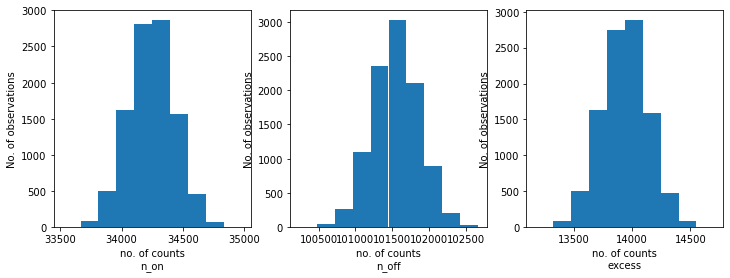

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 29min 21s, sys: 5.44 s, total: 29min 27s
Wall time: 29min 36s


In [15]:
results

[{'index': 2.2169905875495766,
  'amplitude': 1.2845712545260467e-12,
  'lambda_': 0.2801792257657554},
 {'index': 2.2324943380030526,
  'amplitude': 1.2364897746094746e-12,
  'lambda_': 0.28570927813929065},
 {'index': 2.236715787152109,
  'amplitude': 1.2640466245835502e-12,
  'lambda_': 0.3058093664482174},
 {'index': 2.2262640878970683,
  'amplitude': 1.2624740793001813e-12,
  'lambda_': 0.302405819333618},
 {'index': 2.2385731783387843,
  'amplitude': 1.276663483135211e-12,
  'lambda_': 0.30673699196054943},
 {'index': 2.1992461618258976,
  'amplitude': 1.3302284553934254e-12,
  'lambda_': 0.3431724199735729},
 {'index': 2.2416099341604867,
  'amplitude': 1.243665549675842e-12,
  'lambda_': 0.2871674134846505},
 {'index': 2.2238247278324987,
  'amplitude': 1.2845374429121784e-12,
  'lambda_': 0.3019087052854374},
 {'index': 2.2235248230739075,
  'amplitude': 1.248766419923766e-12,
  'lambda_': 0.27479277111955186},
 {'index': 2.2589641058301537,
  'amplitude': 1.1745196406545453e-

index: 2.2192553342203083 += 0.018321652722248973


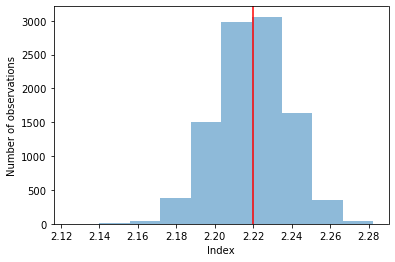

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.2919540869180557e-12 += 4.768985291175522e-14


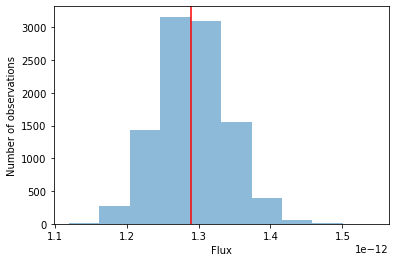

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 0.30121190641592477 += 0.02281329836279117


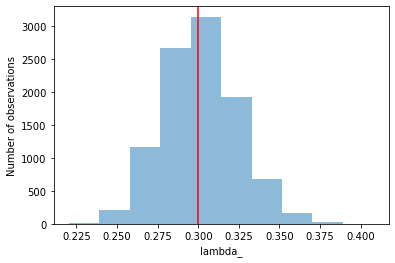

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")